In [1]:
!pip install h2o

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.2/265.2 MB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.3-py2.py3-none-any.whl size=265293968 sha256=f21356d69d13f45fb75af97897205e1820c40aa3bfc434b025bac6c0e63a7291
  Stored in directory: /root/.cache/pip/wheels/77/9a/1c/2da26f943fd46b57f3c20b54847b936b9152b831dc7447cf71
Successfully built h2o


In [2]:
import h2o
from h2o.automl import H2OAutoML

In [3]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpncsm7tyv
  JVM stdout: /tmp/tmpncsm7tyv/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpncsm7tyv/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,2 months and 5 days
H2O_cluster_name:,H2O_from_python_unknownUser_p7oq9l
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


### importing data

In [4]:
day = h2o.import_file("day.csv")

hour = h2o.import_file("hour.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [5]:
#target column

y = "cnt"

### Split into train & test

In [6]:
# splitting day dataset
splits_day = day.split_frame(ratios = [0.75], seed = 2)
train_day = splits_day[0]
test_day = splits_day[1]

#splitting hour dataset
splits_hour = day.split_frame(ratios = [0.75], seed = 2)
train_hour = splits_hour[0]
test_hour = splits_hour[1]

### testing model using Day.csv dataset

#### model 1

In [8]:
# Run AutoML for 10 minutes
aml = H2OAutoML(max_runtime_secs=600, seed=10)
aml.train(y=y, training_frame=train_day)

AutoML progress: |
10:50:22.916: _train param, Dropping bad and constant columns: [dteday]

█
10:50:28.239: _train param, Dropping bad and constant columns: [dteday]

█
10:50:28.471: _train param, Dropping bad and constant columns: [dteday]
10:50:29.95: _train param, Dropping unused columns: [dteday]
10:50:29.214: _train param, Dropping bad and constant columns: [dteday]

██
10:50:31.306: _train param, Dropping bad and constant columns: [dteday]

█
10:50:33.119: _train param, Dropping bad and constant columns: [dteday]
10:50:34.312: _train param, Dropping bad and constant columns: [dteday]

█
10:50:35.249: _train param, Dropping bad and constant columns: [dteday]

█
10:50:36.715: _train param, Dropping unused columns: [dteday]
10:50:36.845: _train param, Dropping unused columns: [dteday]
10:50:36.977: _train param, Dropping bad and constant columns: [dteday]

█████
10:50:43.575: _train param, Dropping bad and constant columns: [dteday]

█
10:50:45.100: _train param, Dropping bad and co

key,value
Stacking strategy,cross_validation
Number of base models (used / total),6/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),2/2
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_4_AutoML_2_20240226_105022,33.2017,1102.35,26.5542,0.140578,1102.35,130,0.140634,StackedEnsemble
DeepLearning_grid_1_AutoML_2_20240226_105022_model_1,75.0201,5628.02,63.7454,0.147001,5628.02,13858,0.003434,DeepLearning
StackedEnsemble_BestOfFamily_5_AutoML_2_20240226_105022,84.0689,7067.58,43.2681,0.260499,7067.58,630,0.047497,StackedEnsemble
GBM_grid_1_AutoML_2_20240226_105022_model_99,107.932,11649.4,63.8104,0.234647,11649.4,259,0.019238,GBM
GBM_grid_1_AutoML_2_20240226_105022_model_156,111.03,12327.7,72.0839,0.258667,12327.7,273,0.023993,GBM
XGBoost_grid_1_AutoML_2_20240226_105022_model_111,117.187,13732.7,77.5273,0.232862,13732.7,172,0.007155,XGBoost
GBM_grid_1_AutoML_2_20240226_105022_model_139,118.888,14134.3,70.0362,0.249304,14134.3,227,0.020611,GBM
GBM_grid_1_AutoML_2_20240226_105022_model_70,120.992,14639,71.1878,0.233474,14639,285,0.020091,GBM
GBM_grid_1_AutoML_2_20240226_105022_model_160,121.617,14790.7,80.0718,0.233198,14790.7,152,0.015624,GBM
GBM_grid_1_AutoML_2_20240226_105022_model_101,122.557,15020.2,84.7169,0.24163,15020.2,158,0.017388,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

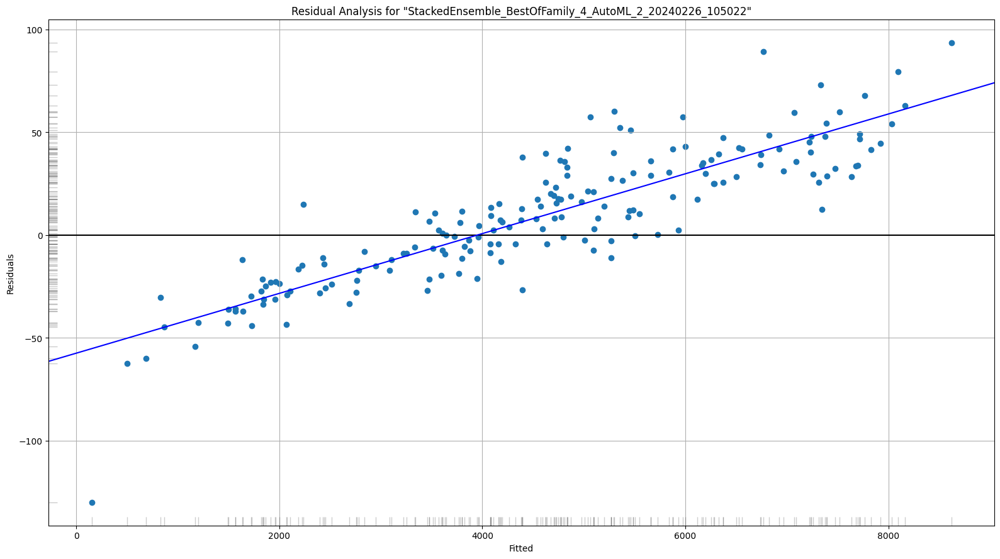

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

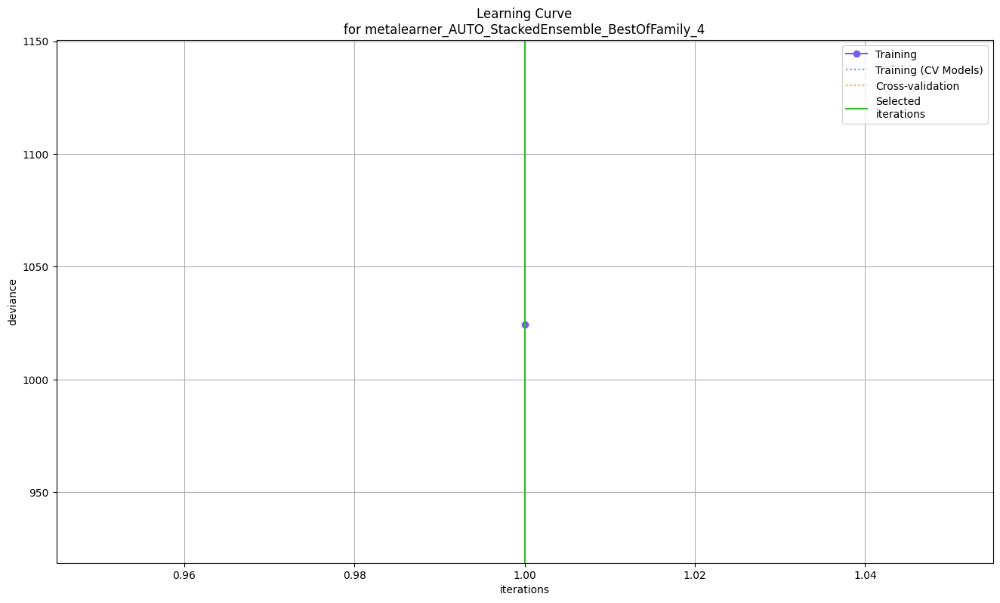

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

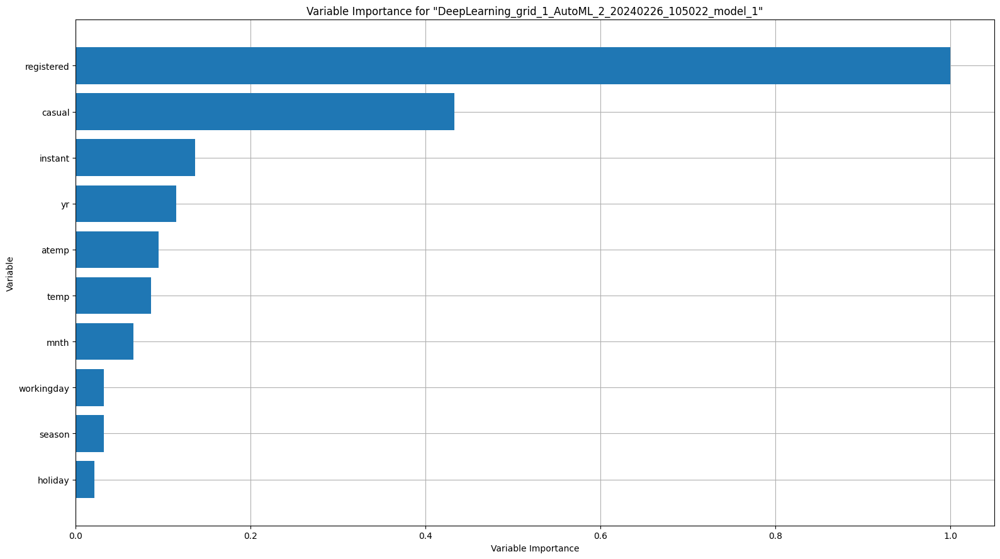

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

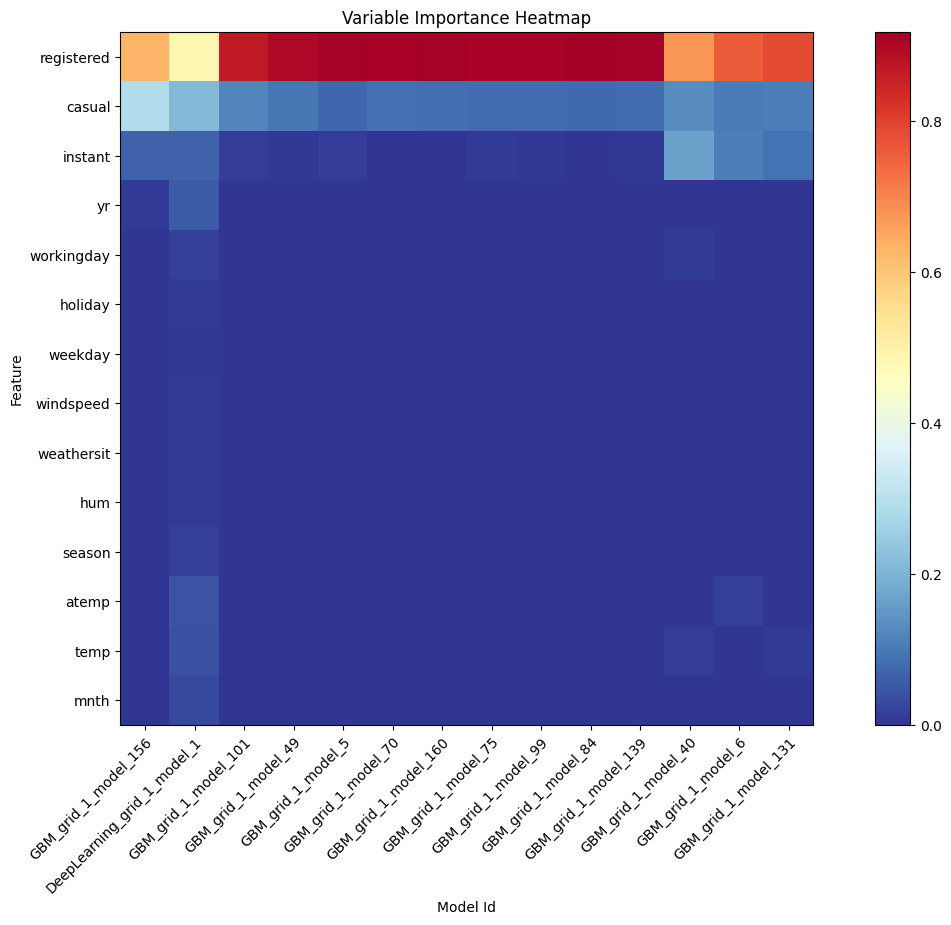

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

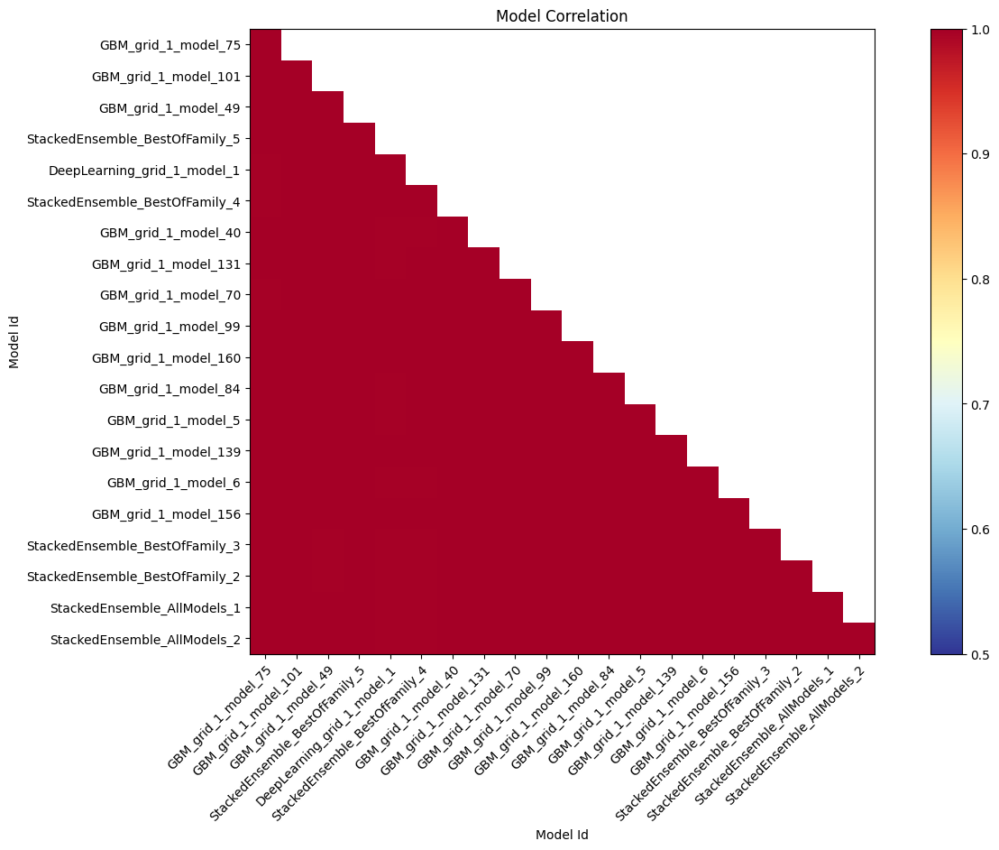

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

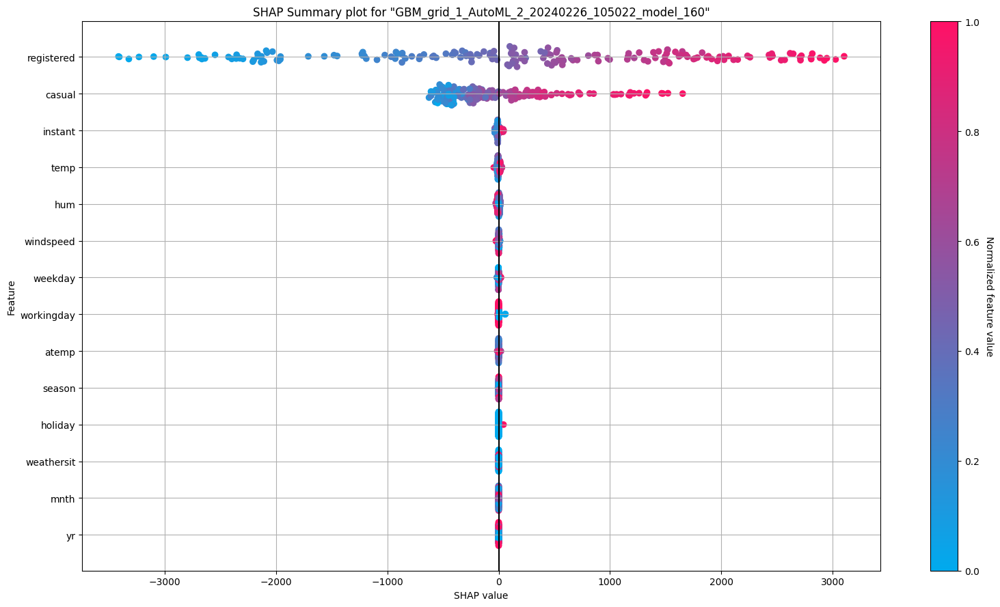

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

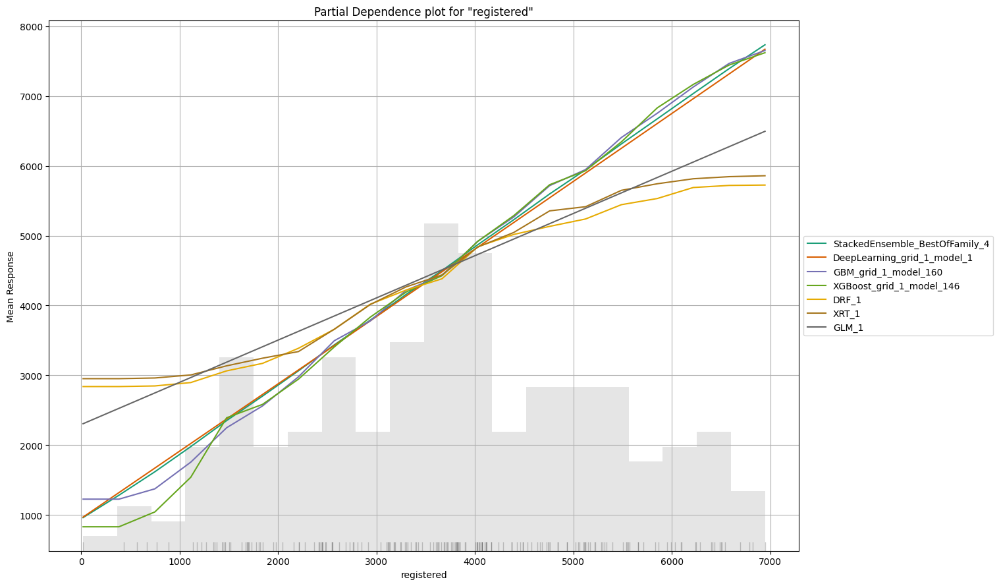

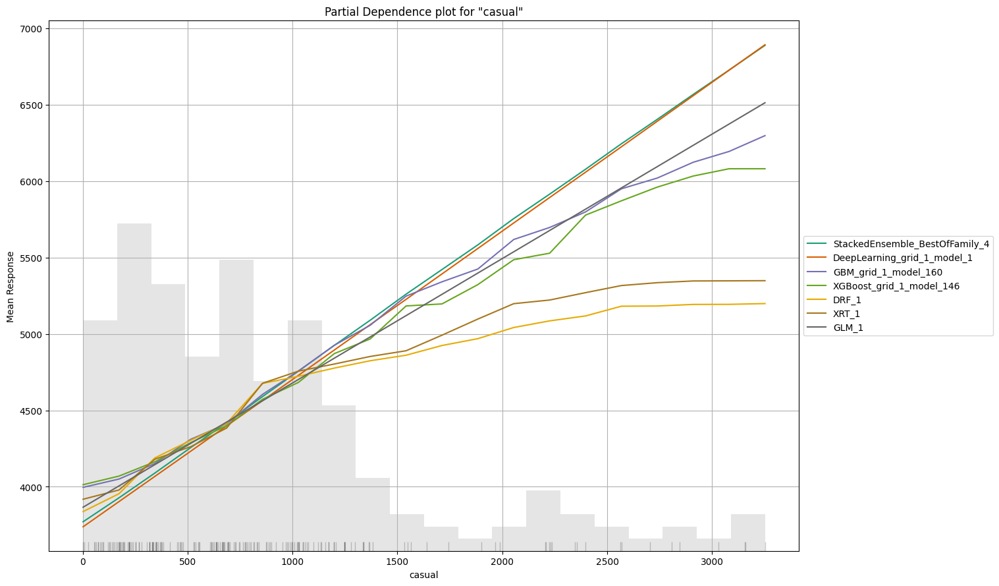

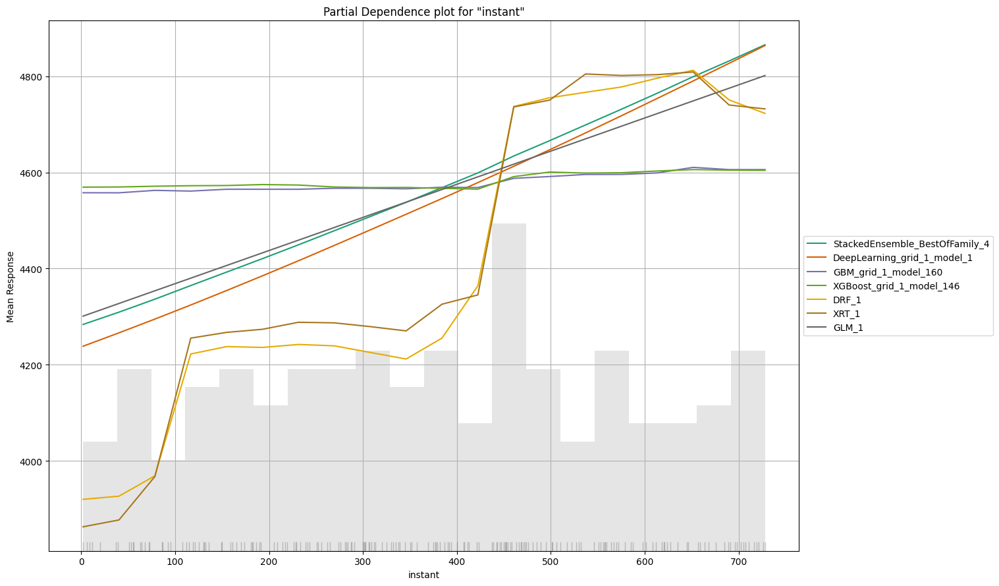

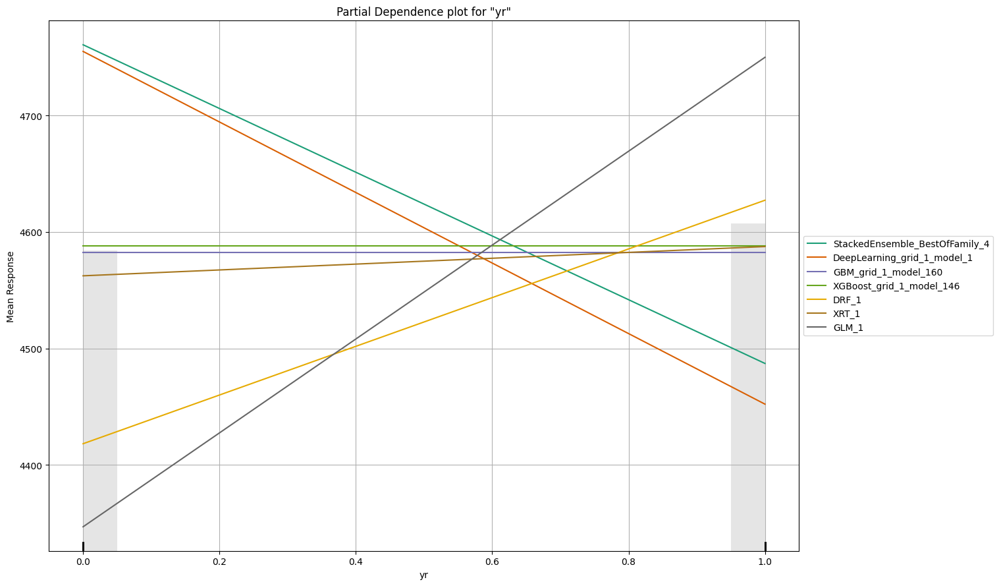

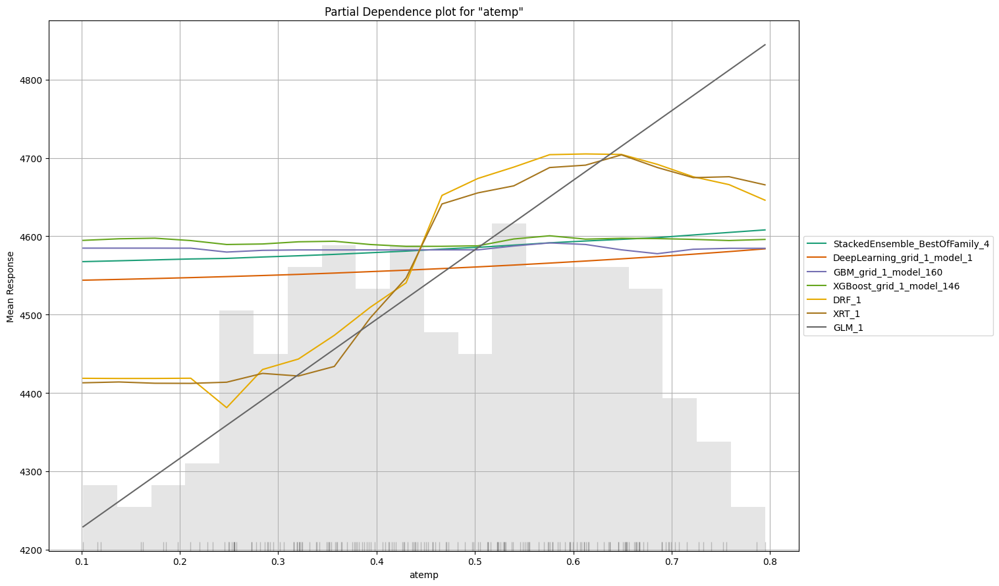

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

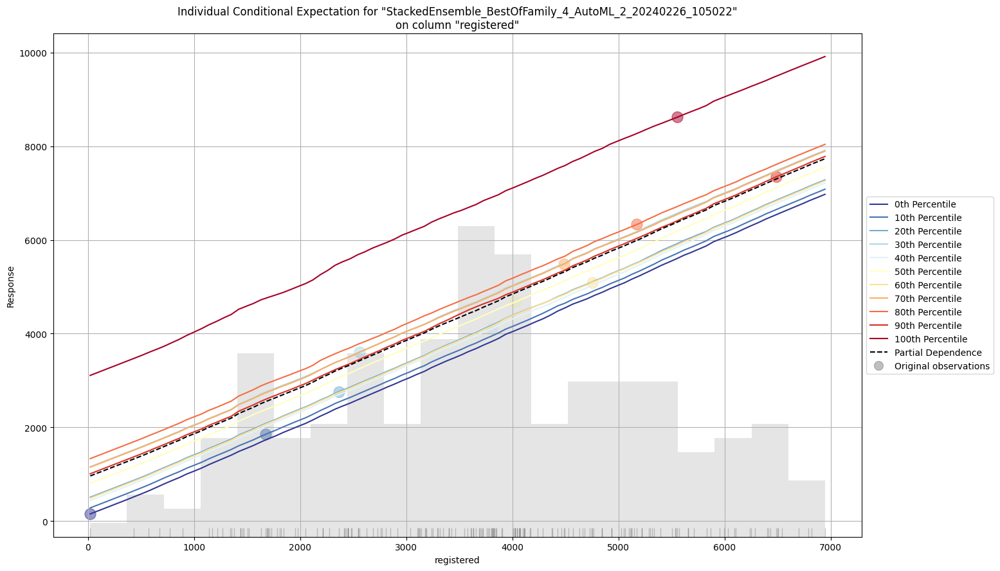

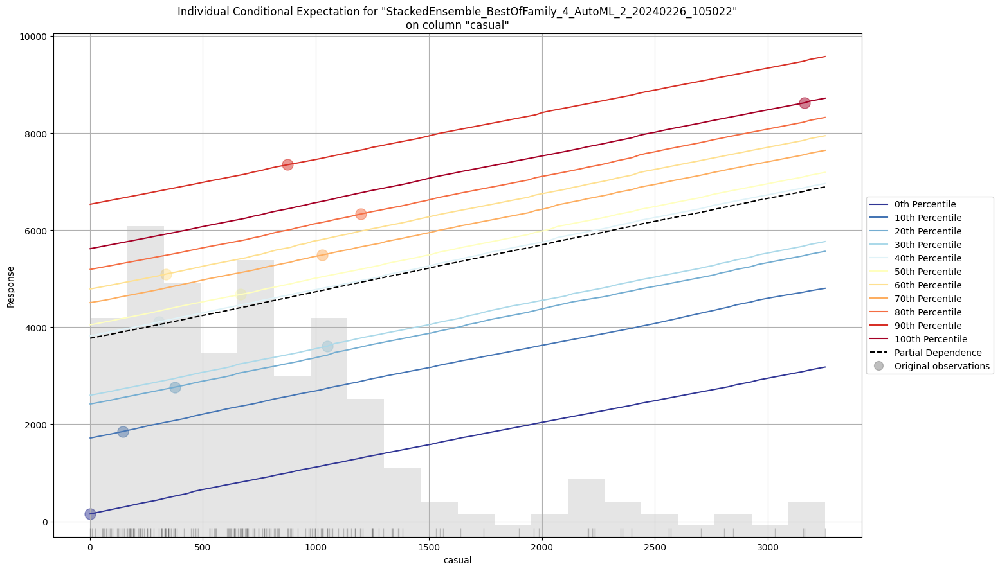

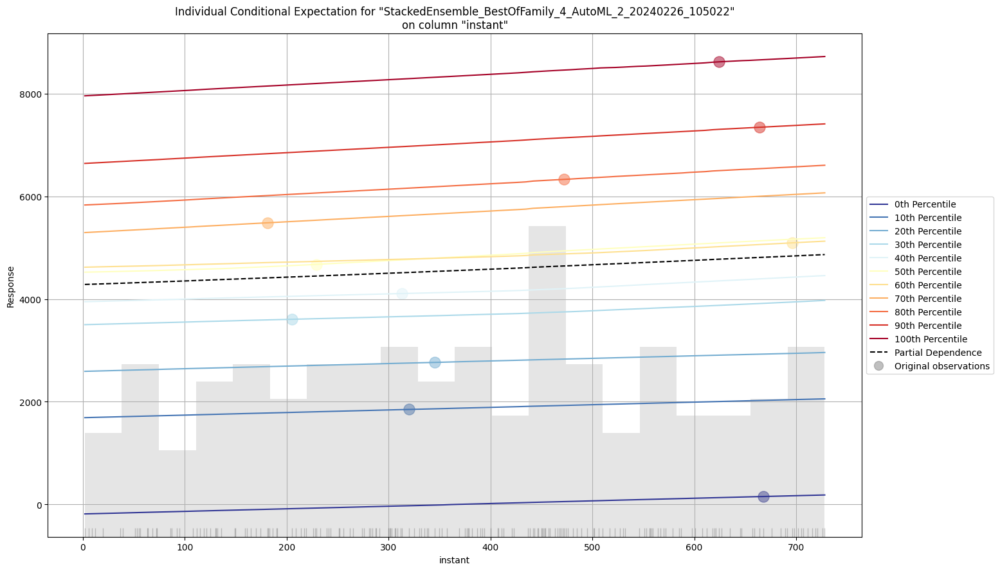

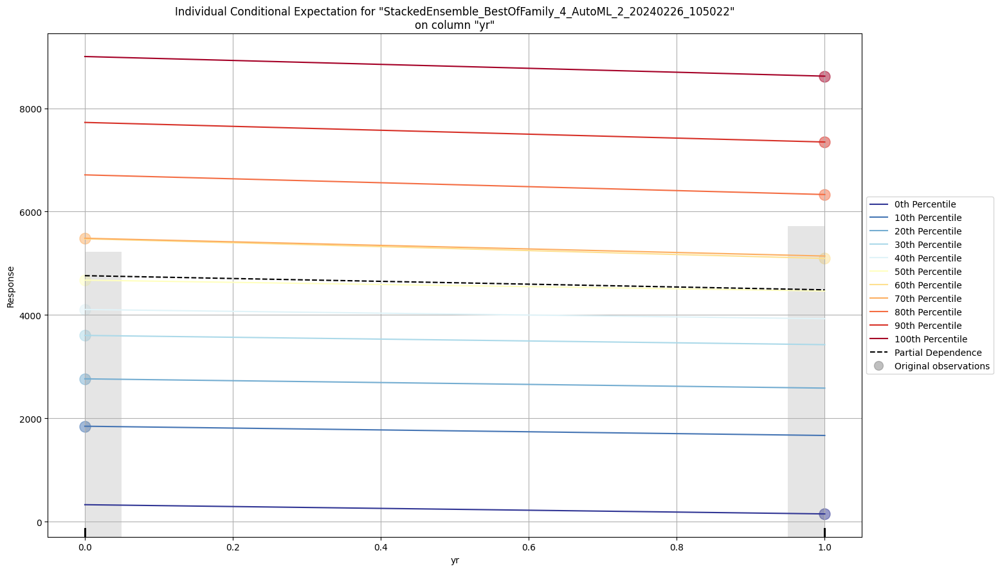

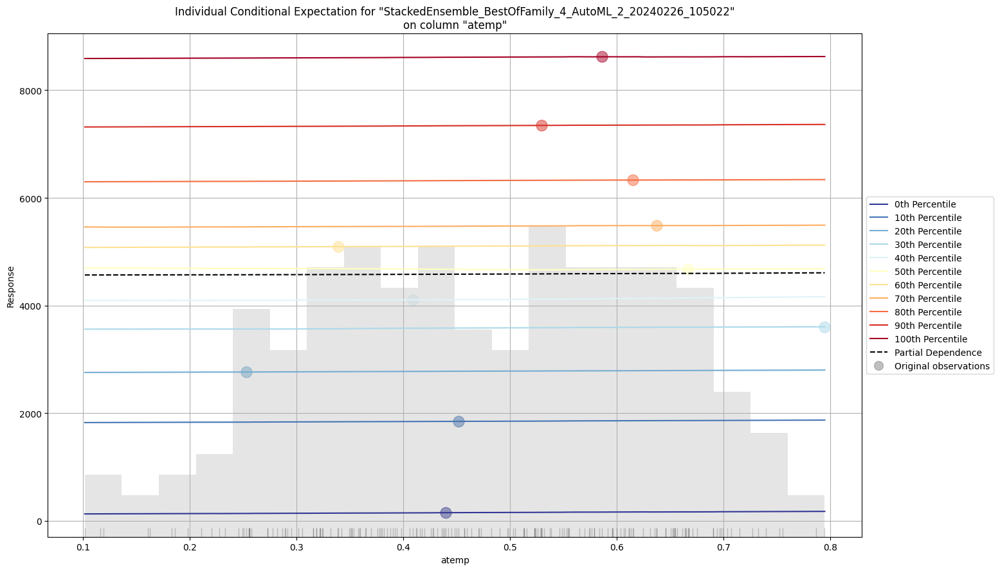

In [9]:
# Explain leader model & compare with all AutoML models
exa = aml.explain(test_day)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

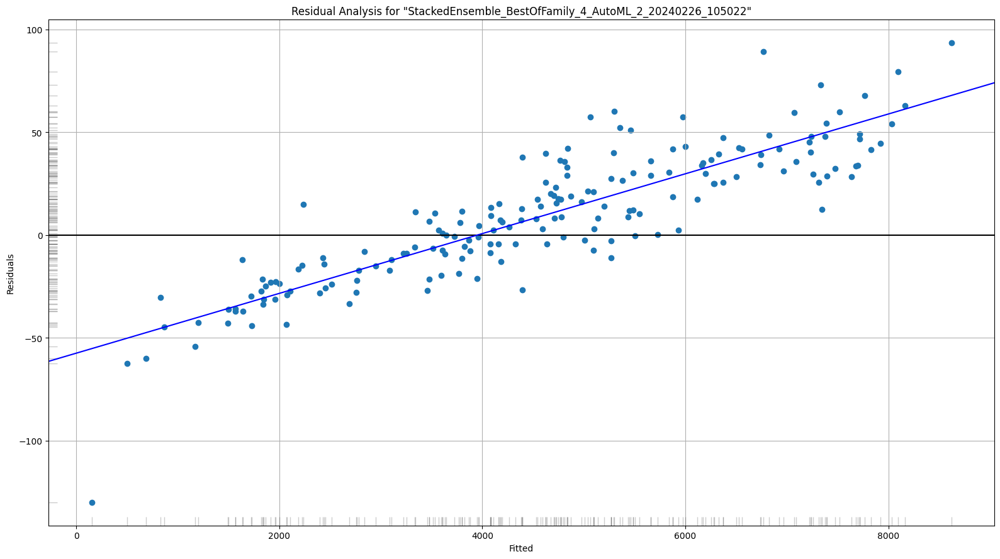

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

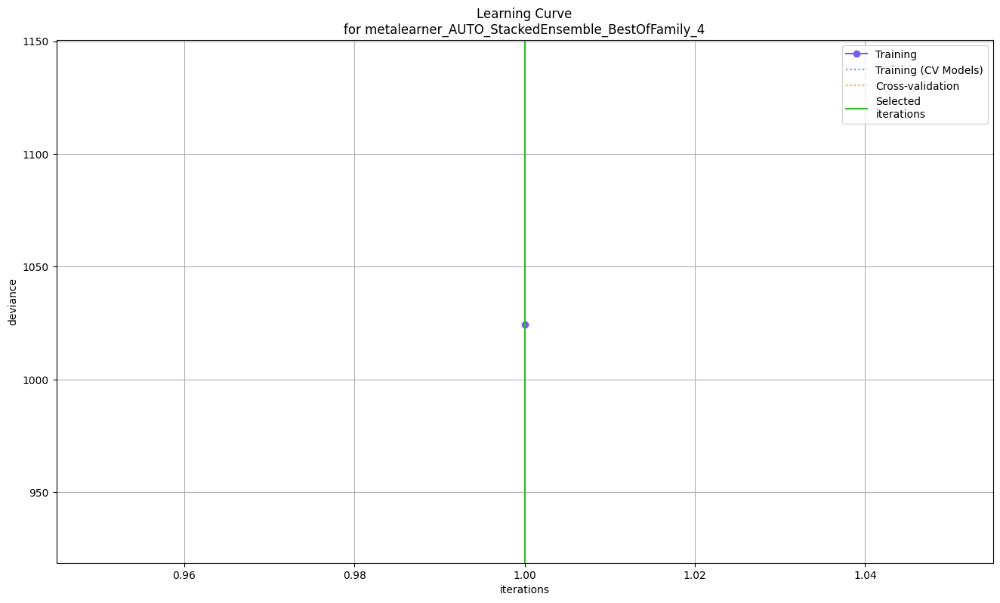

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

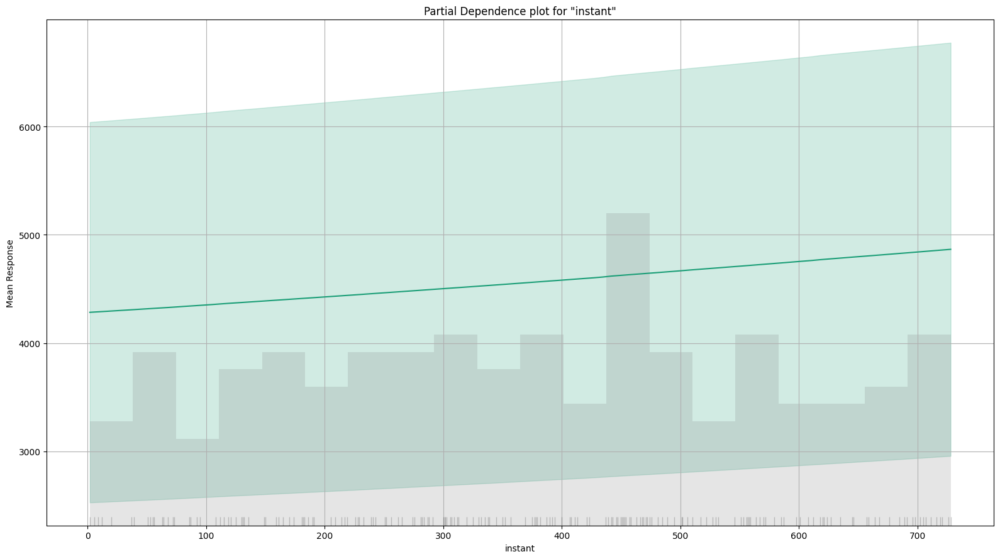

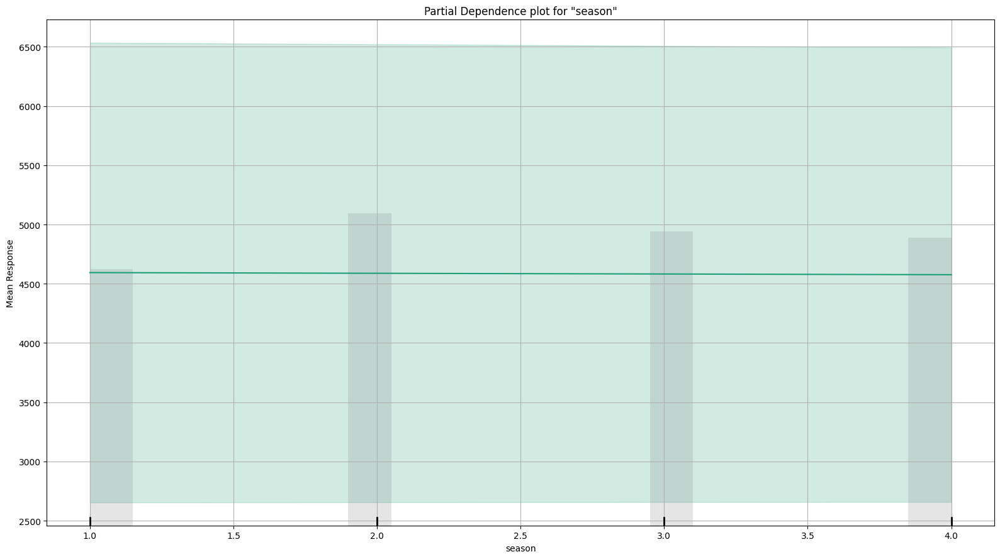

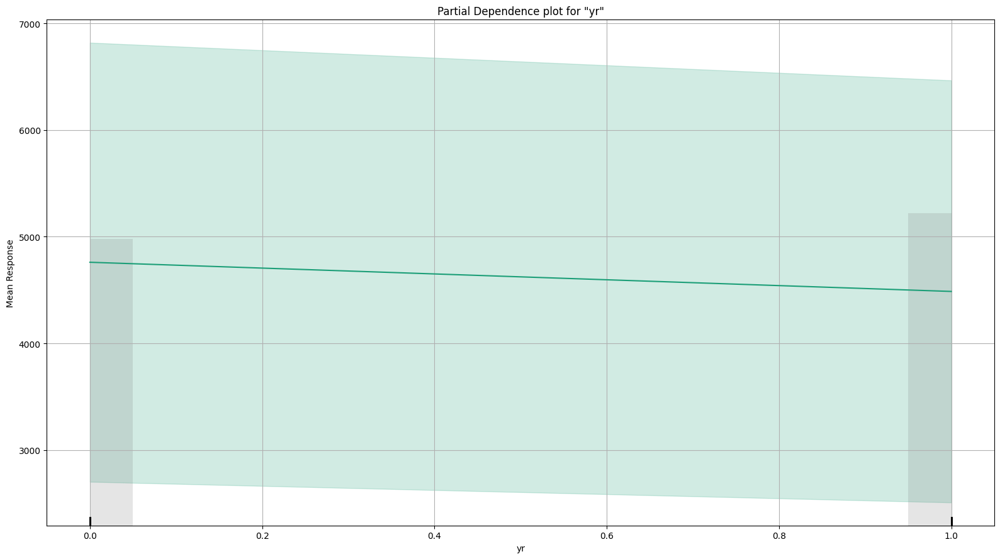

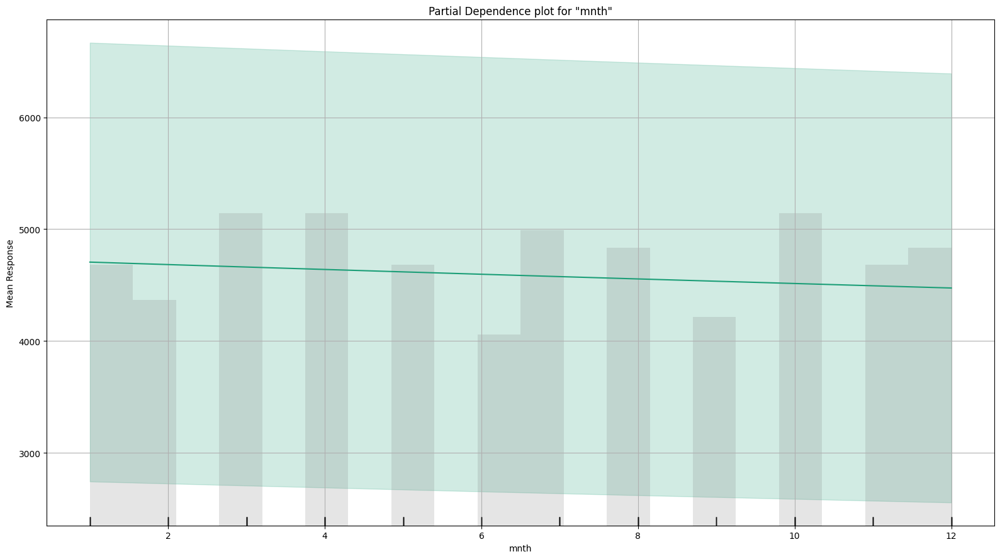

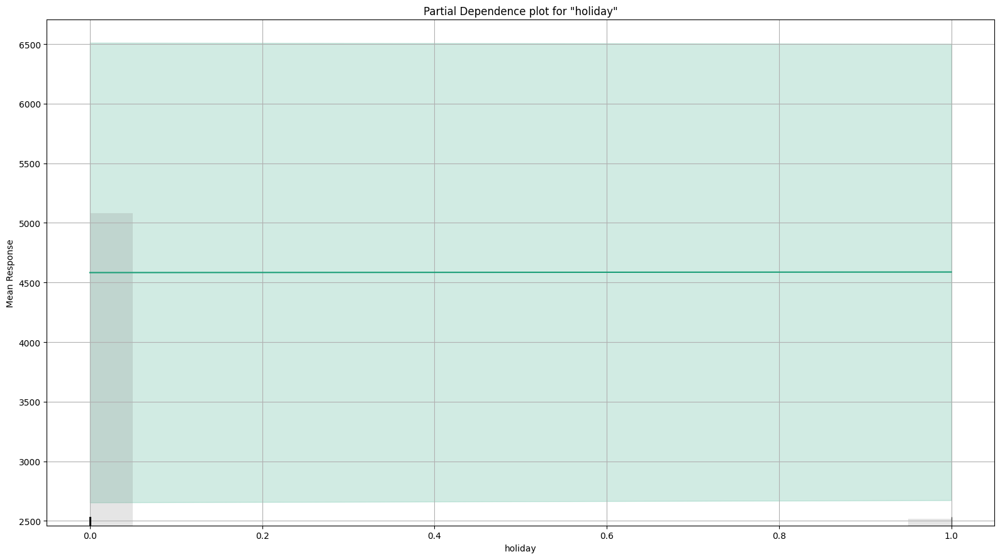

...

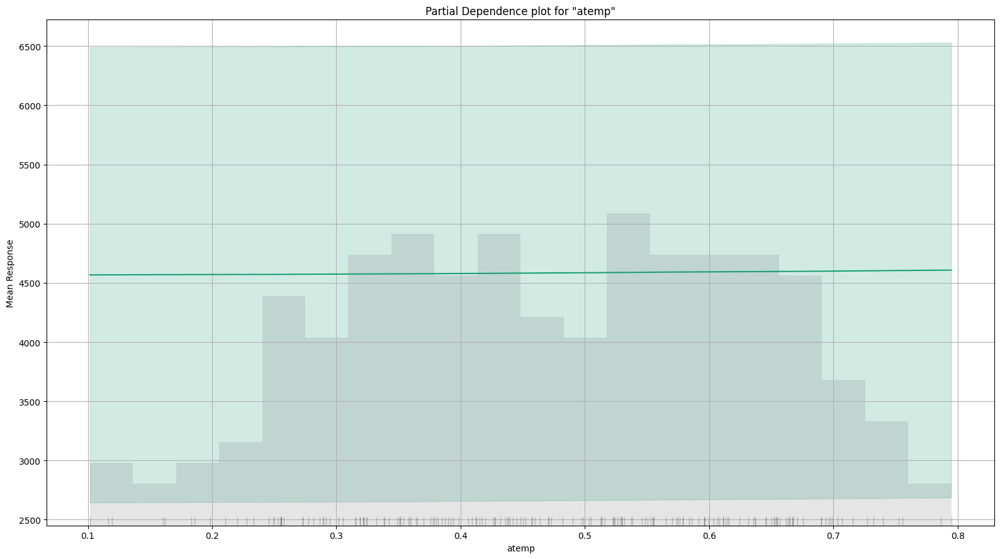

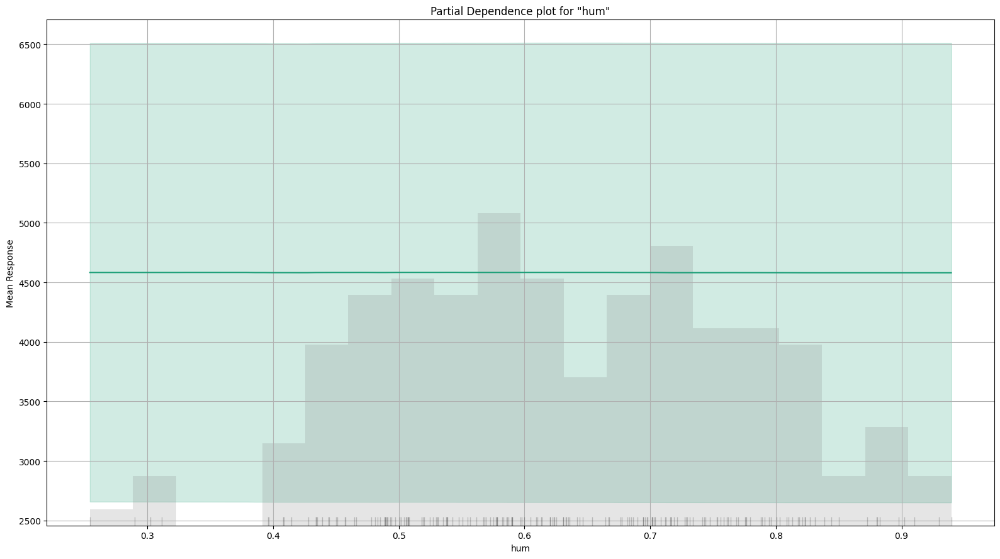

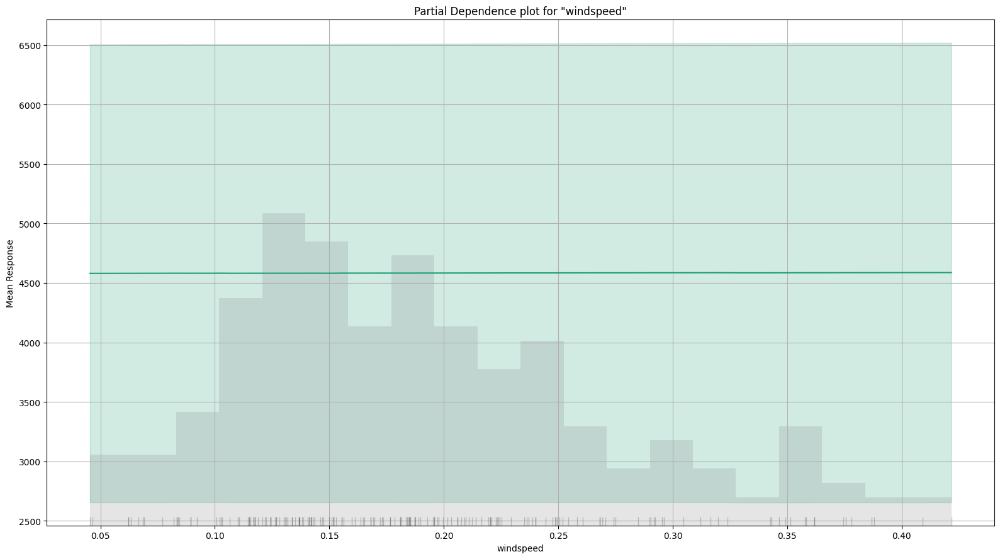

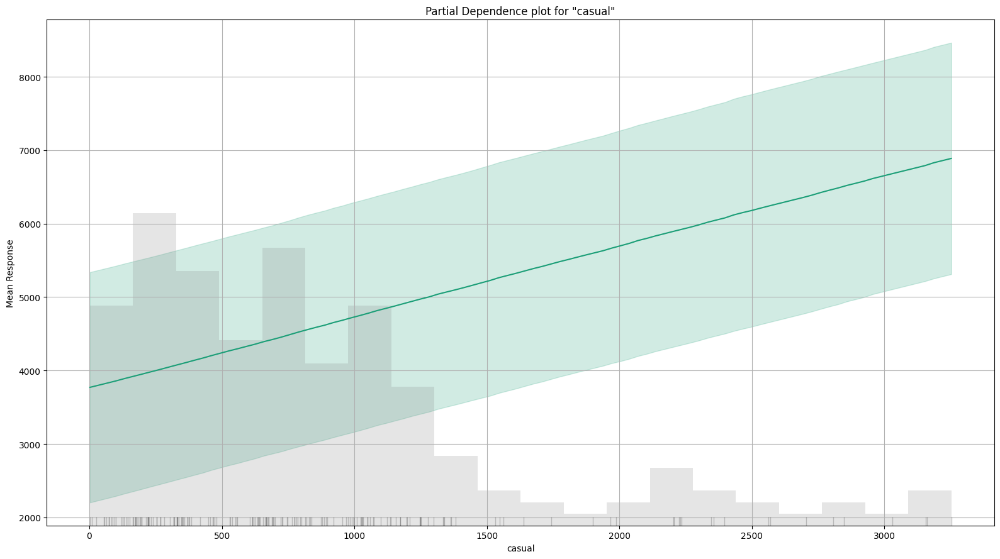

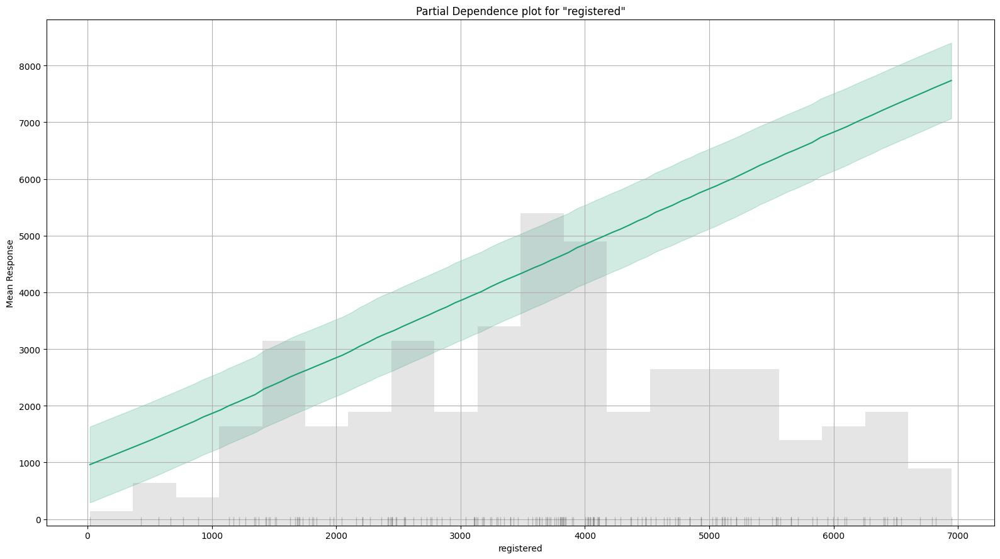

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

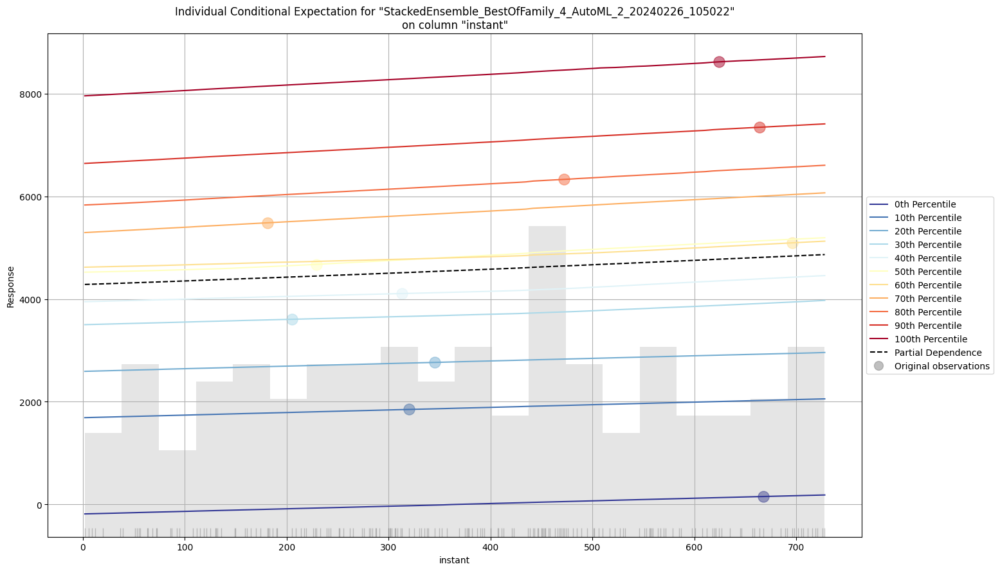

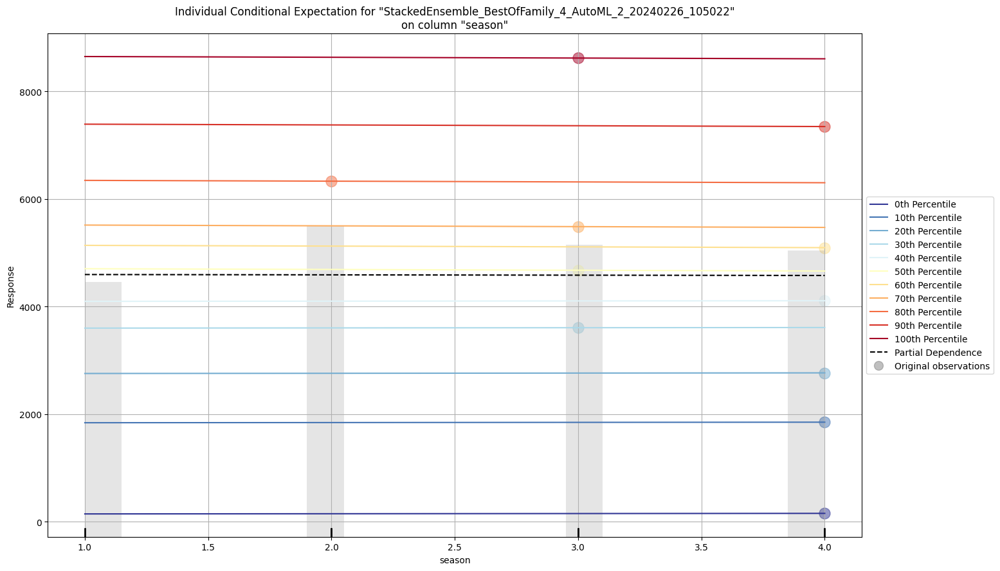

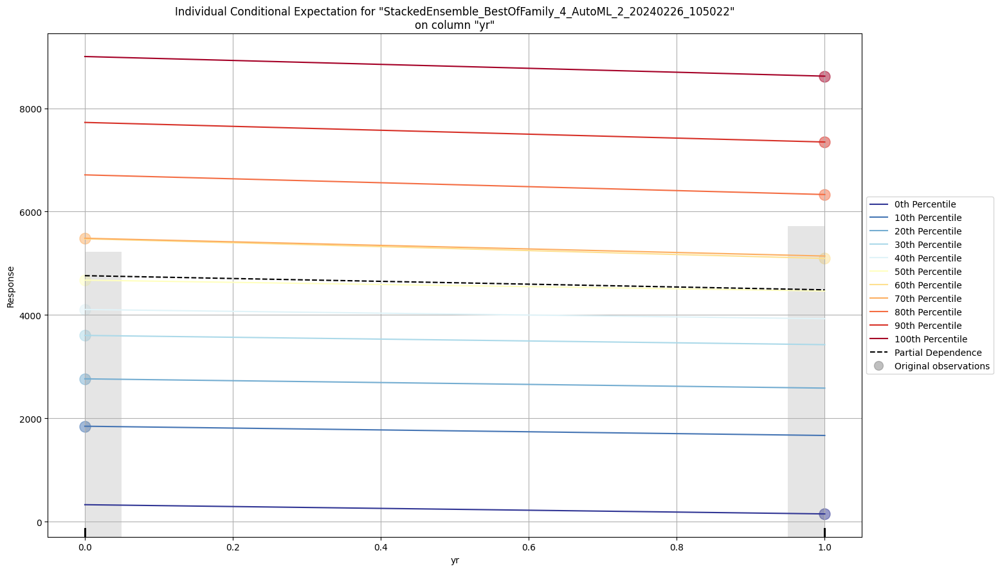

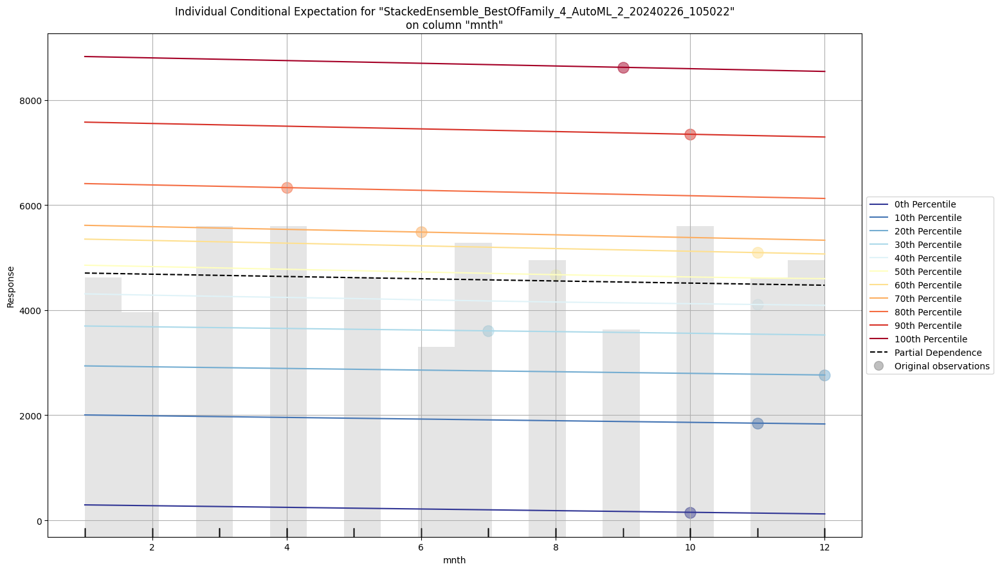

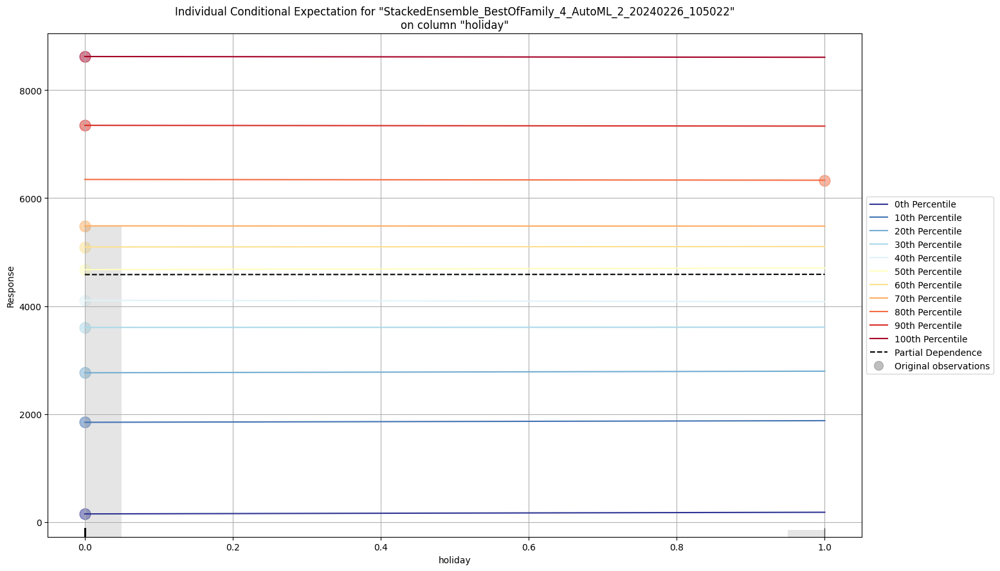

...

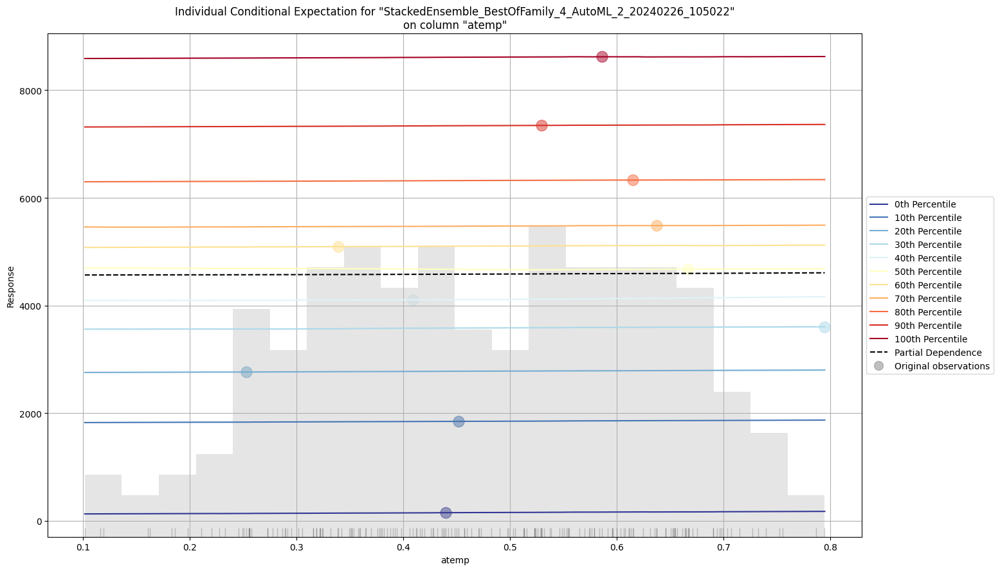

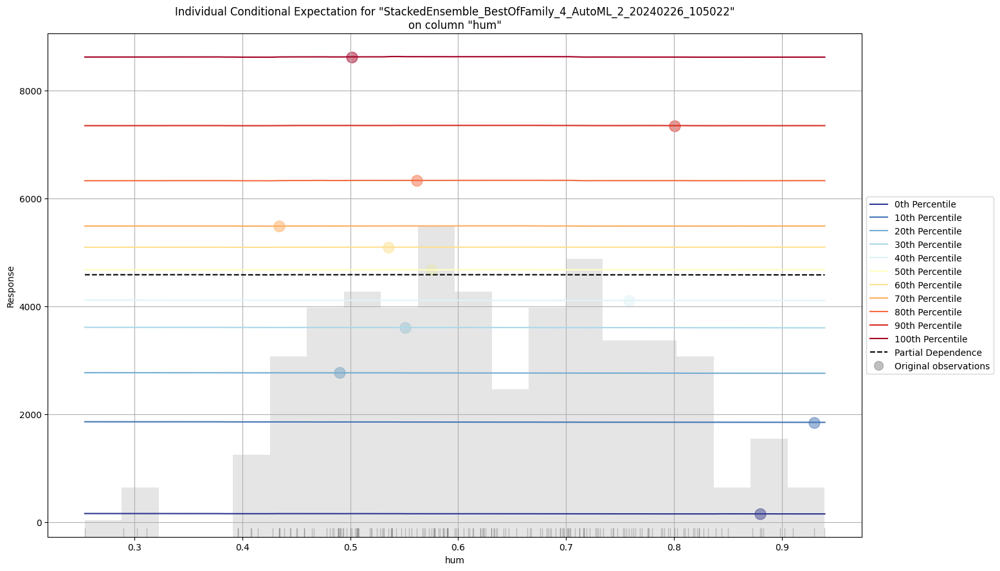

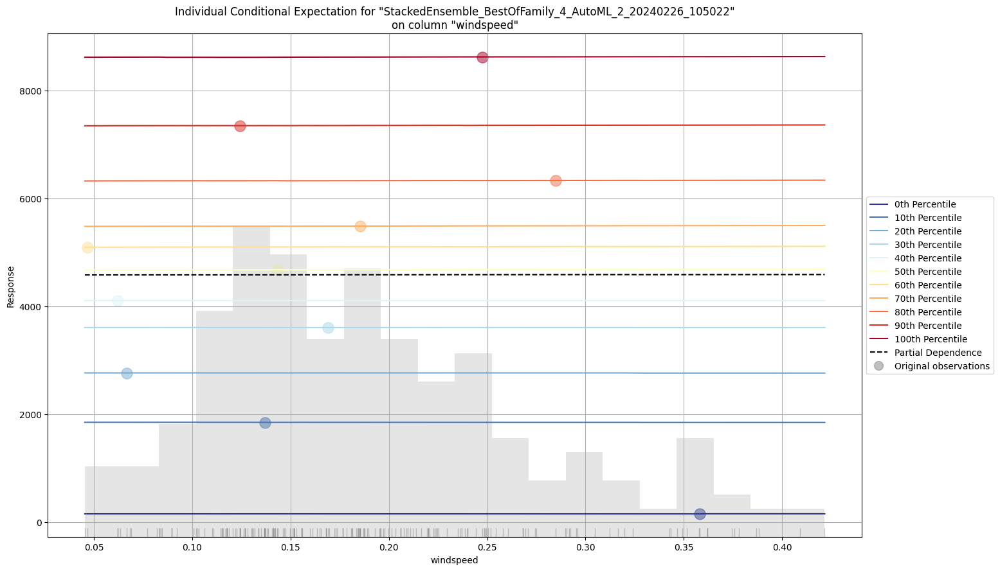

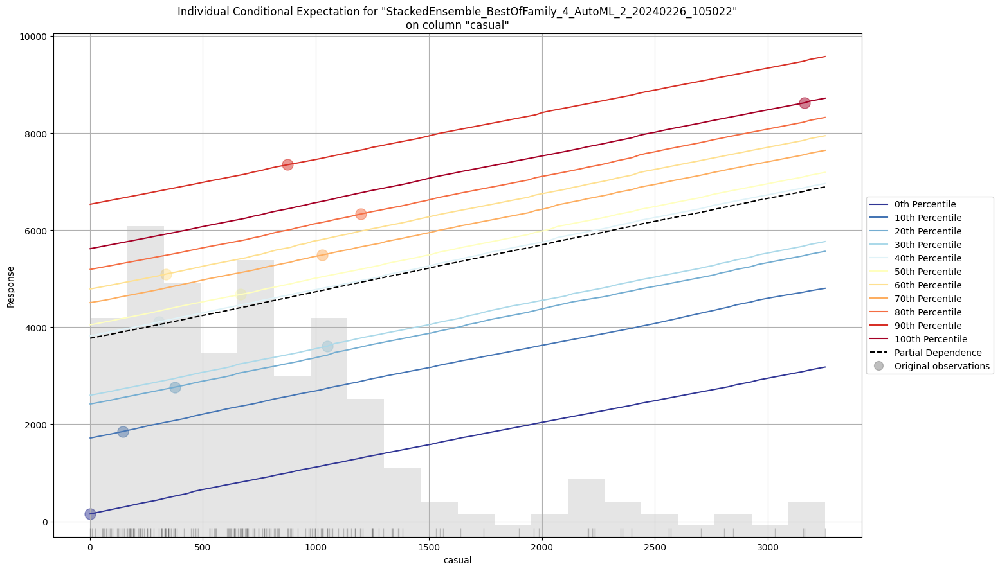

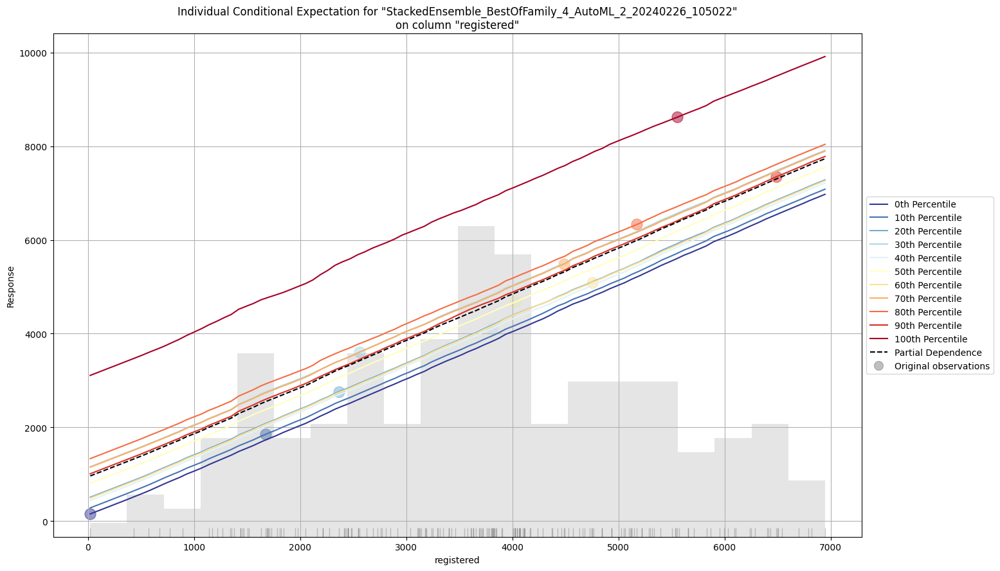

In [10]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm = aml.leader.explain(test_day)

In [11]:
pred = aml.predict(test_day)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [12]:
pred

predict
831.413
1643.06
866.805
1204.51
1958.38
1634.97
1565.73
1833.43
1492.82
1840.6


### model 2

In [13]:
from h2o.estimators import H2ORandomForestEstimator

In [14]:
day_drf = H2ORandomForestEstimator()

day_drf.train(y=y, training_frame=train_day)

drf Model Build progress: |

/usr/local/lib/python3.10/dist-packages/h2o/estimators/estimator_base.py:192: RuntimeWarning: Dropping bad and constant columns: [dteday]
  warnings.warn(mesg["message"], RuntimeWarning)


██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_model_python_1708943426940_59


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    50                 50                          219415                 13           19           16.32         321           365           345

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 79145.93722672433
RMSE: 281.3288773423808
MAE: 191.0904171084214
RMSLE: 0.1237890095673497
Mean Residual Deviance: 79145.93722672433

Scoring History: 
     timestamp            duration    number_of_trees    training_rmse       training_mae        training_deviance
---  -------------------  ----------  -----------------  ------------------  ------------------  -------------------
     2024-02-26 11:07:24  0.006 sec   0.0                nan                 nan                 nan
     2024-02-26 11:07:24  0.019 sec   1.0                642.0927322663513   414.75853658536585  412283.0768292683
     2024-02-26 11:07:24  0.063 sec   2.0                604.0523003849046   400.24410029498523  364879.181600295
     2024-02-26 11:07:24  0.068 sec   3.0                573.918232579316    378.95953525641016  329382.13768696587
     2024-02-26 11:07:24  0.074 sec   4.0                502.54850735432115  325.4545123726347   252555.0022440562
     2024-02-26 11:07:24  0.080 sec   5.0                532.063508406495    337.6582995267071   283091.57697782834
     2024-02-26 11:07:24  0.086 sec   6.0                498.3154332718671   325.0885964912279   248318.27103692864
     2024-02-26 11:07:24  0.092 sec   7.0                453.425150351768    299.57962533005536  205594.36697152344
     2024-02-26 11:07:24  0.098 sec   8.0                426.54863939326395  282.2478953279424   181943.74176824474
     2024-02-26 11:07:24  0.104 sec   9.0                431.5726999370263   277.8950382018477   186254.99533093456
---  ---                  ---         ---                ---                 ---                 ---
     2024-02-26 11:07:24  0.256 sec   41.0               297.8184477534308   201.0993595213095   88695.827822263
     2024-02-26 11:07:24  0.261 sec   42.0               294.53349681342274  199.16755750565952  86749.9807451425
     2024-02-26 11:07:24  0.266 sec   43.0               289.23329492305635  196.50994814230125  83655.89889204768
     2024-02-26 11:07:24  0.270 sec   44.0               287.52732699226675  195.32456371079363  82671.9637673179
     2024-02-26 11:07:24  0.275 sec   45.0               285.9274766887229   194.37735950899497  81754.52192558016
     2024-02-26 11:07:24  0.279 sec   46.0               282.37931311182945  192.3847136221097   79738.07647350861
     2024-02-26 11:07:24  0.283 sec   47.0               282.77567240519693  193.4937076187769   79962.08090421124
     2024-02-26 11:07:24  0.288 sec   48.0               284.3370468154563   193.63641593451032  80847.55619173498
     2024-02-26 11:07:24  0.293 sec   49.0               281.76592535545836  191.87652456511188  79392.03669141773
     2024-02-26 11:07:24  0.300 sec   50.0               281.3288773423808   191.0904171084214   79145.93722672433
[51 rows x 7 columns]


Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
registered  3.26662e+10            1                    0.39541
casual      1.81561e+10            0.555807             0.219772
instant     1.20785e+10            0.369755             0.146205
temp        6.21623e+09            0.190295             0.0752448
atemp       5.18534e+09            0.158737             0.0627663
yr          3.457e+09              0.105828           

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

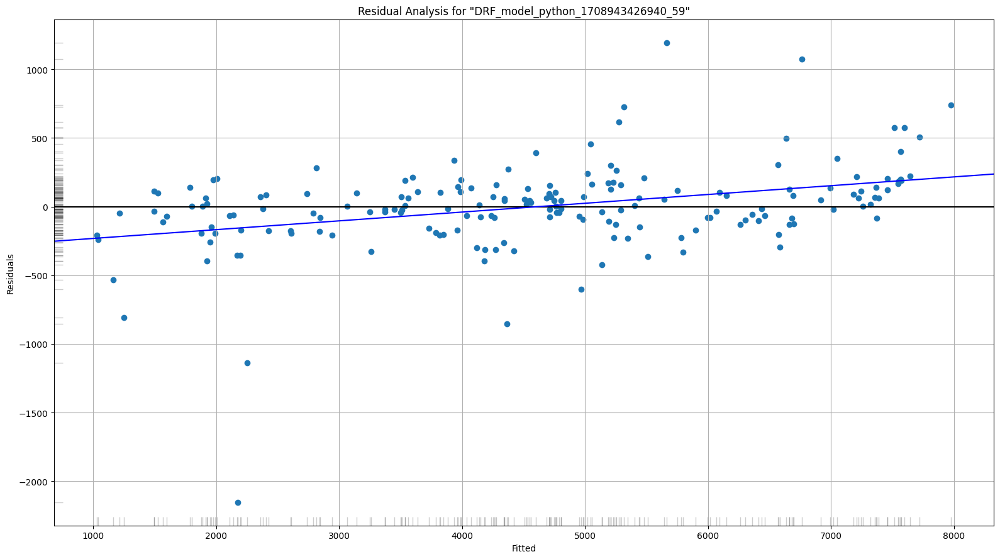

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

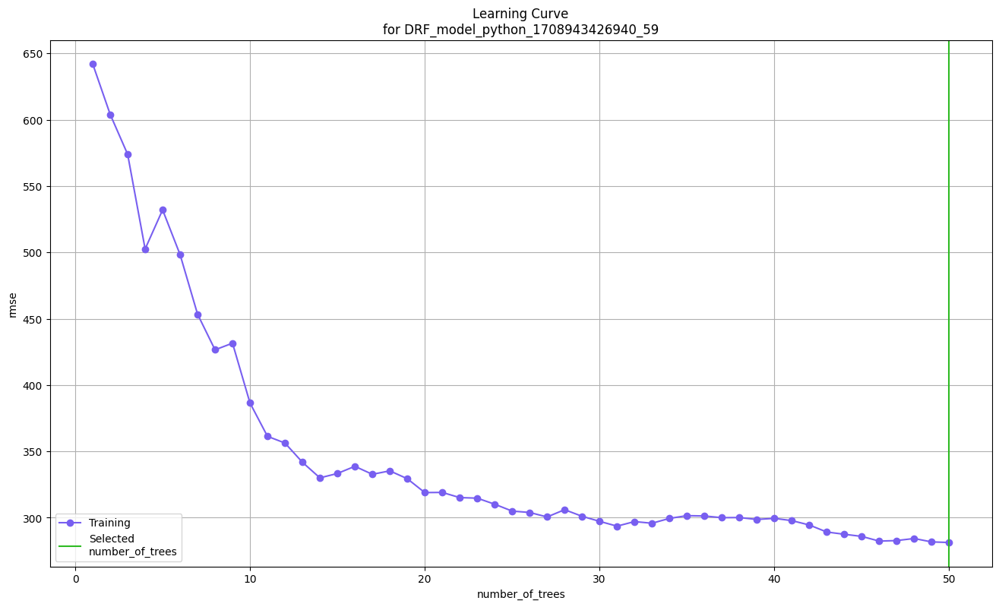

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

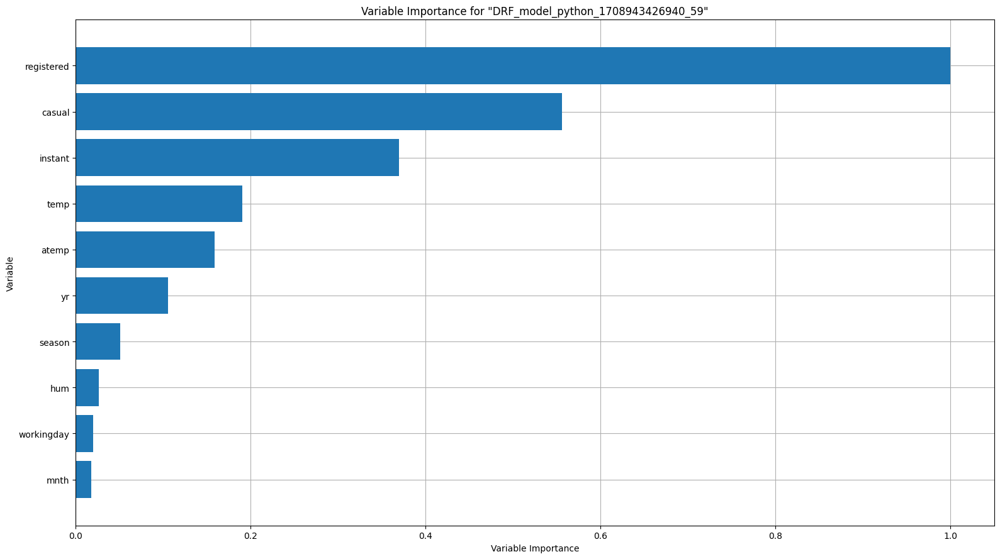

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

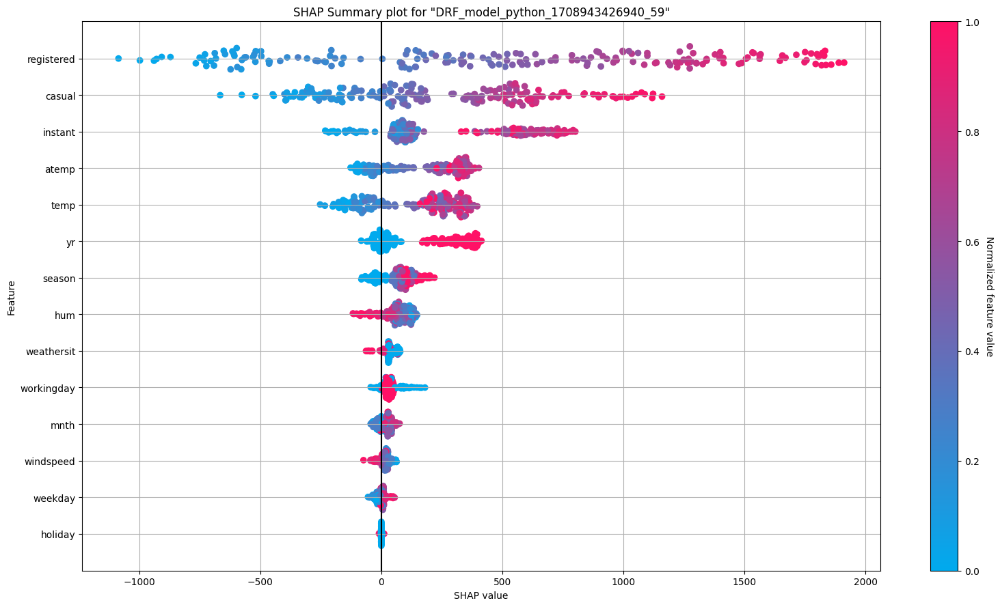

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

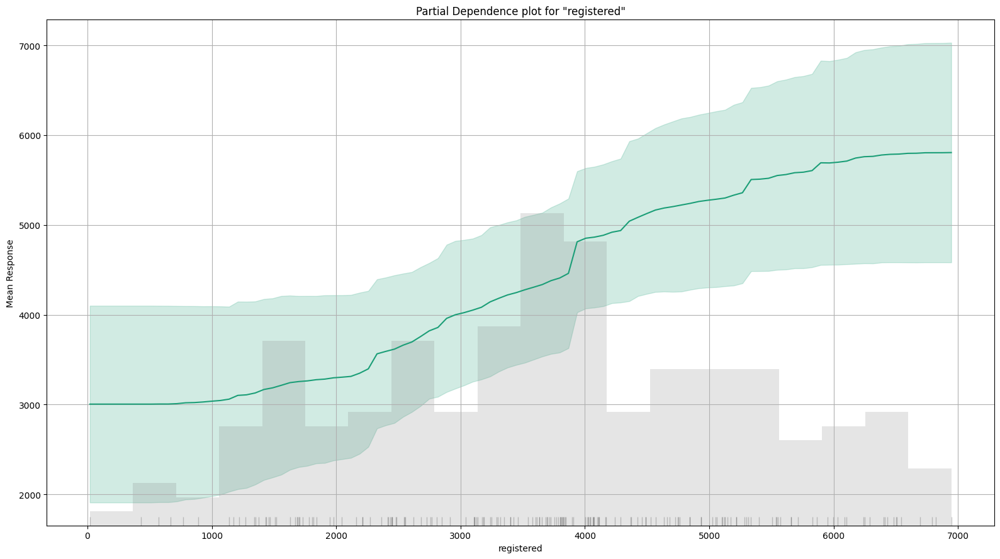

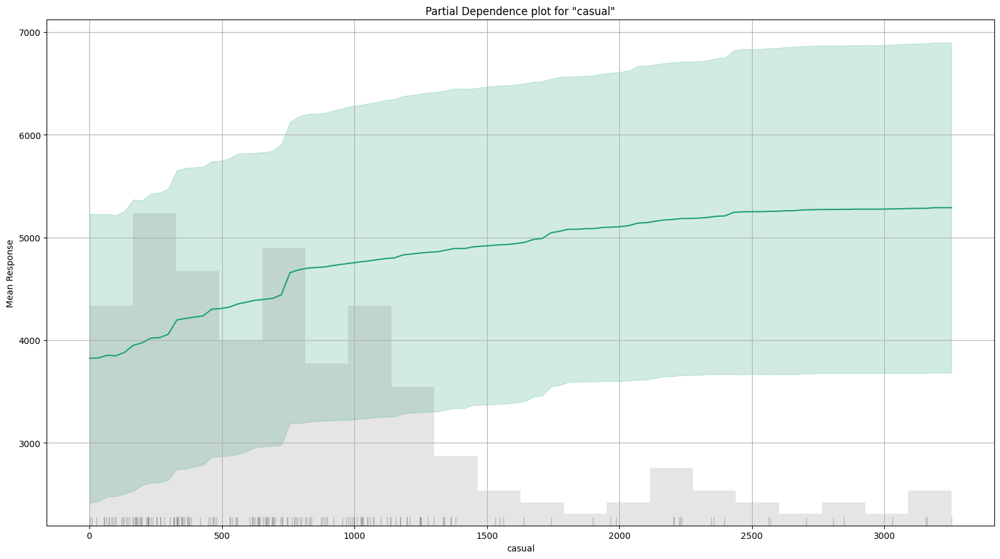

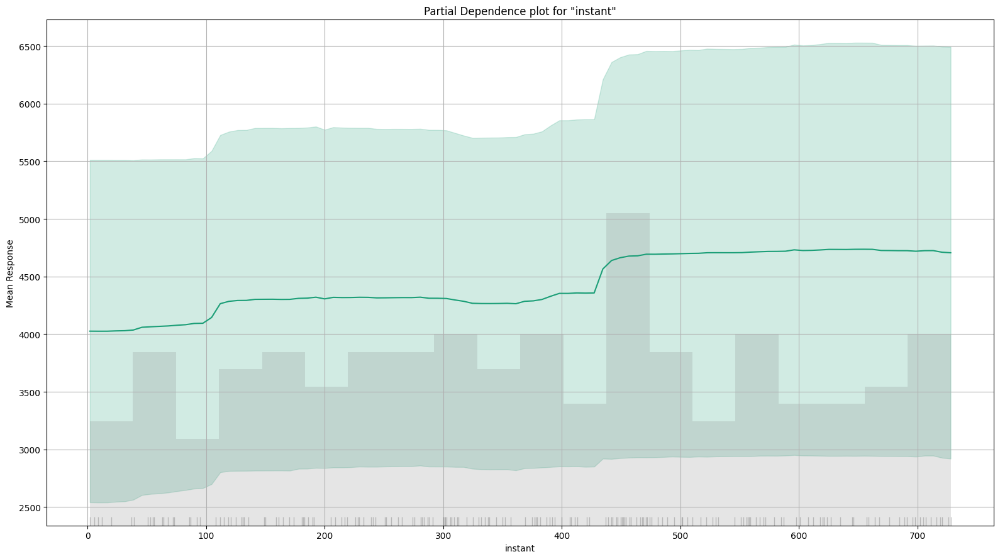

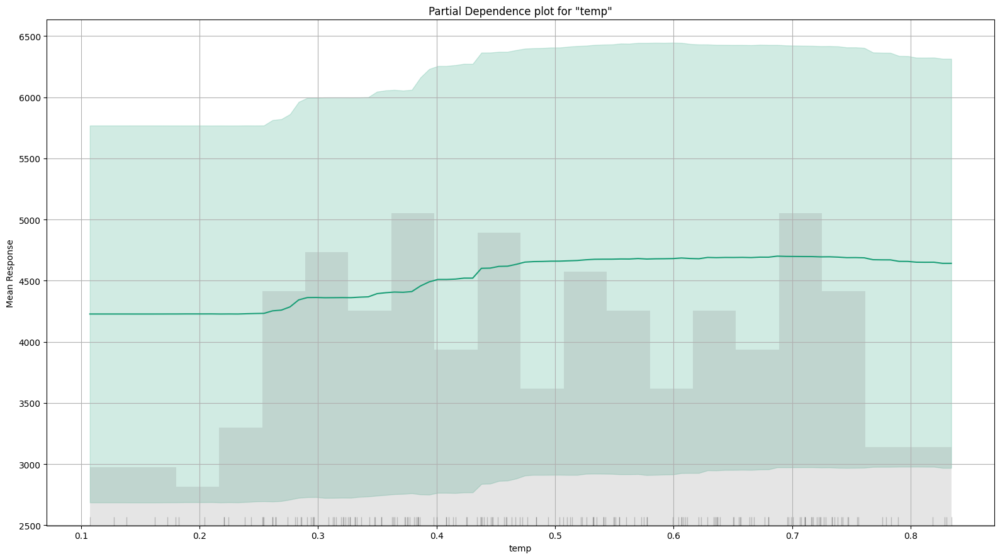

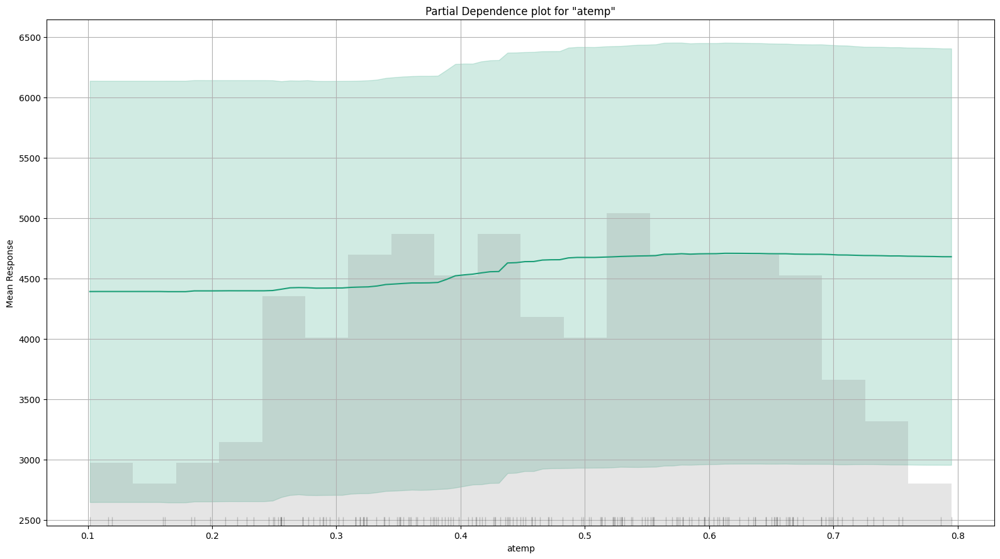

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

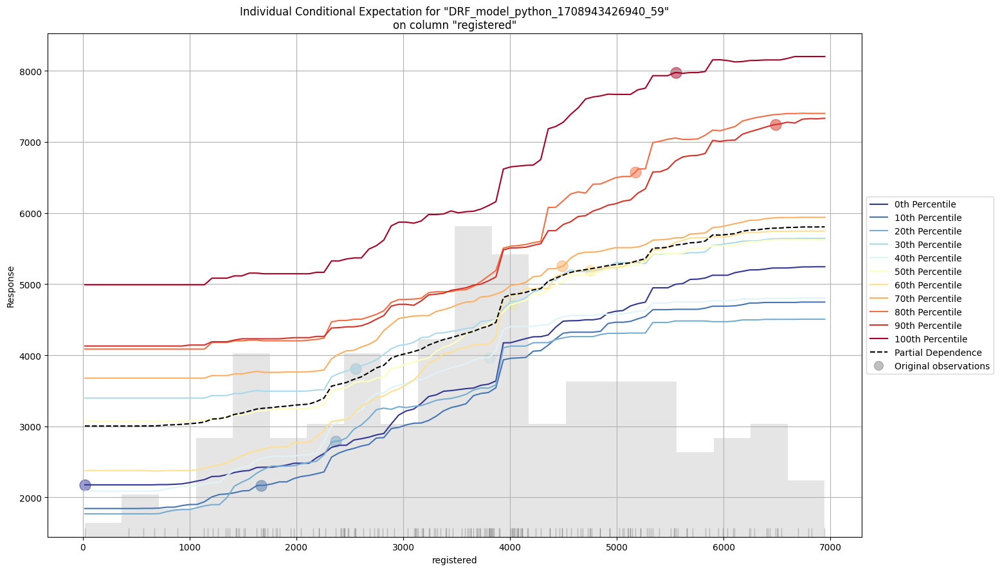

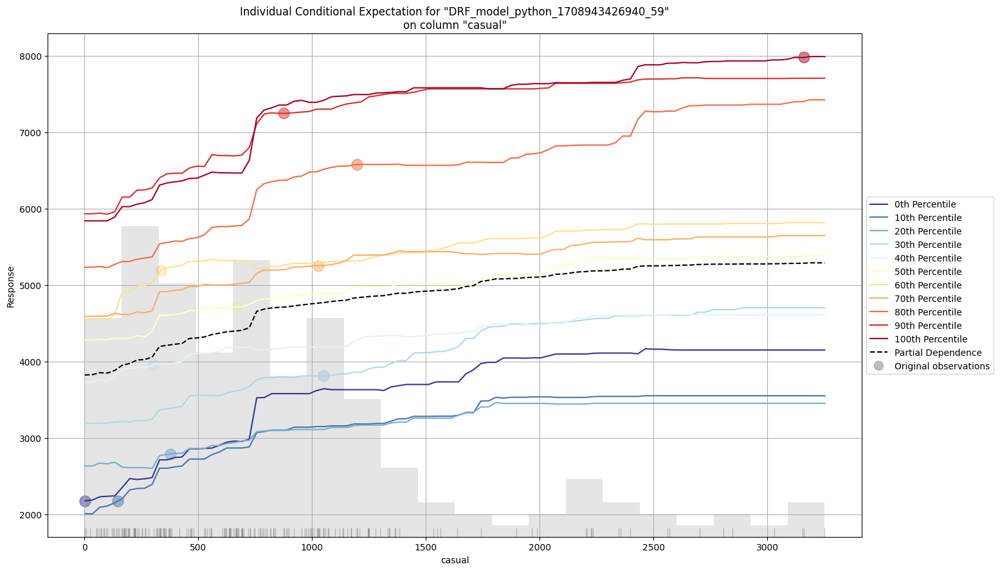

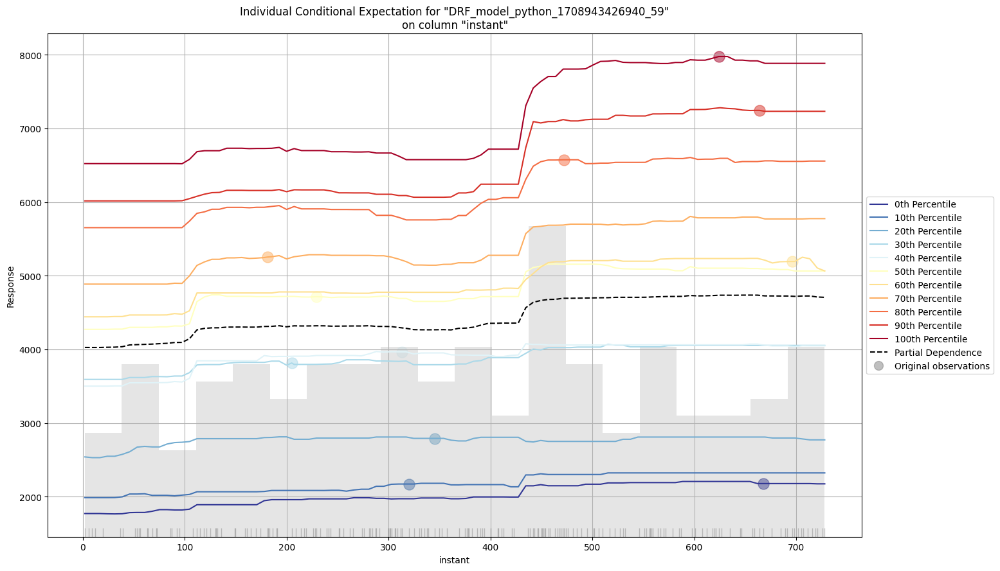

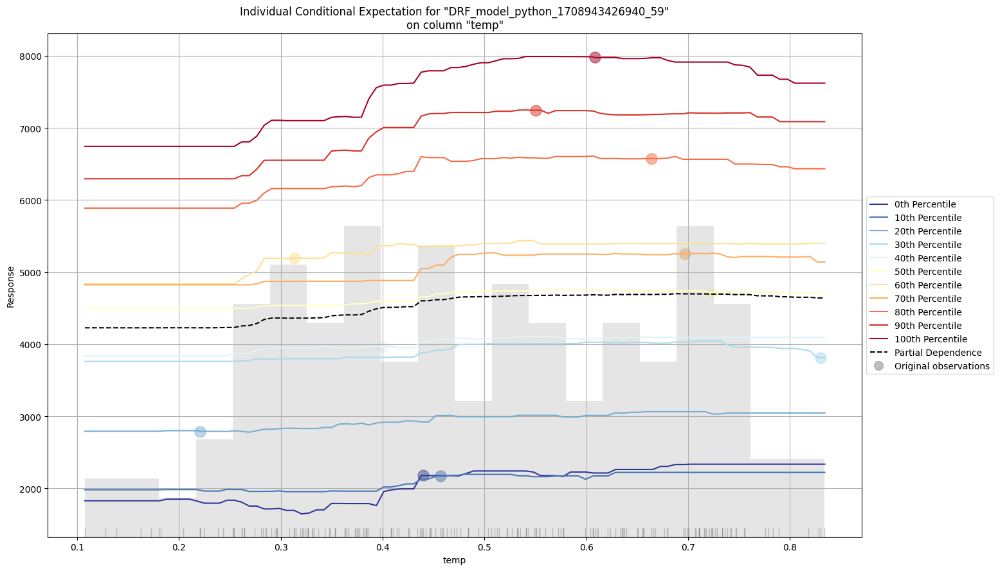

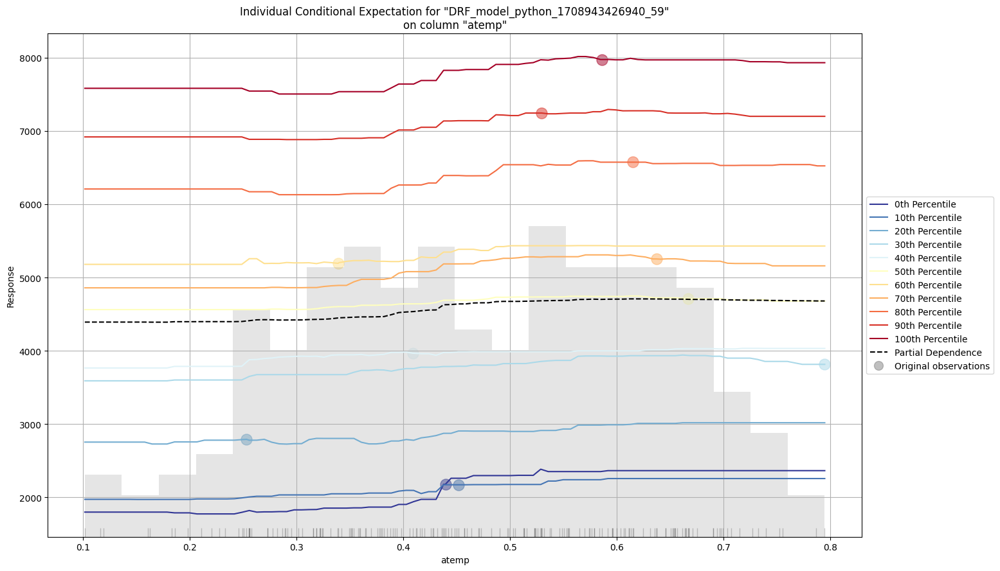

In [15]:
exp = day_drf.explain(test_day)

In [16]:
perf = day_drf.model_performance()

In [17]:
perf

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 79145.93722672433
RMSE: 281.3288773423808
MAE: 191.0904171084214
RMSLE: 0.1237890095673497
Mean Residual Deviance: 79145.93722672433

In [18]:
pred1 = day_drf.predict(test_day)

pred1

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


predict
1040.64
1493.72
1028.72
1211.1
1785.96
1523.6
1599.28
1961.14
1563.88
1803.04


### testing model on hour dataset

In [19]:
# Run AutoML for 10 minutes
aml1 = H2OAutoML(max_runtime_secs=600, seed=1)
aml1.train(y=y, training_frame=train_hour)

AutoML progress: |
11:08:40.93: _train param, Dropping bad and constant columns: [dteday]

█
11:08:42.914: _train param, Dropping bad and constant columns: [dteday]
11:08:43.71: _train param, Dropping bad and constant columns: [dteday]


11:08:43.642: _train param, Dropping unused columns: [dteday]
11:08:43.759: _train param, Dropping bad and constant columns: [dteday]

██
11:08:45.378: _train param, Dropping bad and constant columns: [dteday]
11:08:46.271: _train param, Dropping bad and constant columns: [dteday]

█
11:08:47.326: _train param, Dropping bad and constant columns: [dteday]

██
11:08:48.802: _train param, Dropping bad and constant columns: [dteday]

█
11:08:49.880: _train param, Dropping unused columns: [dteday]
11:08:49.998: _train param, Dropping unused columns: [dteday]
11:08:50.122: _train param, Dropping bad and constant columns: [dteday]

██
11:08:51.195: _train param, Dropping bad and constant columns: [dteday]

███
11:08:53.421: _train param, Dropping bad and cons

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),0/2
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_4_AutoML_3_20240226_110840,91.1676,8311.53,58.906,0.23335,8311.53,115,0.026623,StackedEnsemble
GBM_grid_1_AutoML_3_20240226_110840_model_170,94.6269,8954.24,60.1269,0.234257,8954.24,197,0.01393,GBM
GBM_grid_1_AutoML_3_20240226_110840_model_144,94.7063,8969.28,61.5142,0.237036,8969.28,253,0.016668,GBM
GBM_grid_1_AutoML_3_20240226_110840_model_119,102.418,10489.4,63.0099,0.235017,10489.4,275,0.016941,GBM
GBM_grid_1_AutoML_3_20240226_110840_model_160,103.988,10813.4,61.6361,0.233747,10813.4,224,0.014833,GBM
XGBoost_grid_1_AutoML_3_20240226_110840_model_3,117.944,13910.7,80.7563,0.231943,13910.7,180,0.004443,XGBoost
XGBoost_grid_1_AutoML_3_20240226_110840_model_124,118.332,14002.5,84.1617,0.239083,14002.5,175,0.005675,XGBoost
GBM_grid_1_AutoML_3_20240226_110840_model_12,121.817,14839.4,77.7827,0.253657,14839.4,200,0.014922,GBM
GBM_grid_1_AutoML_3_20240226_110840_model_130,122.568,15022.8,79.926,0.246525,15022.8,136,0.011087,GBM
GBM_grid_1_AutoML_3_20240226_110840_model_2,126.883,16099.3,86.743,0.256461,16099.3,157,0.012794,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

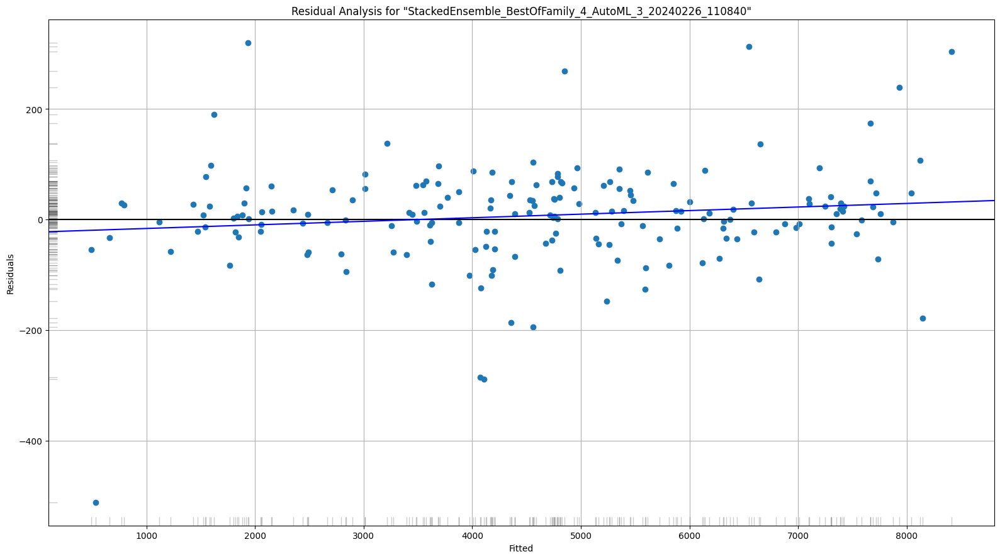

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

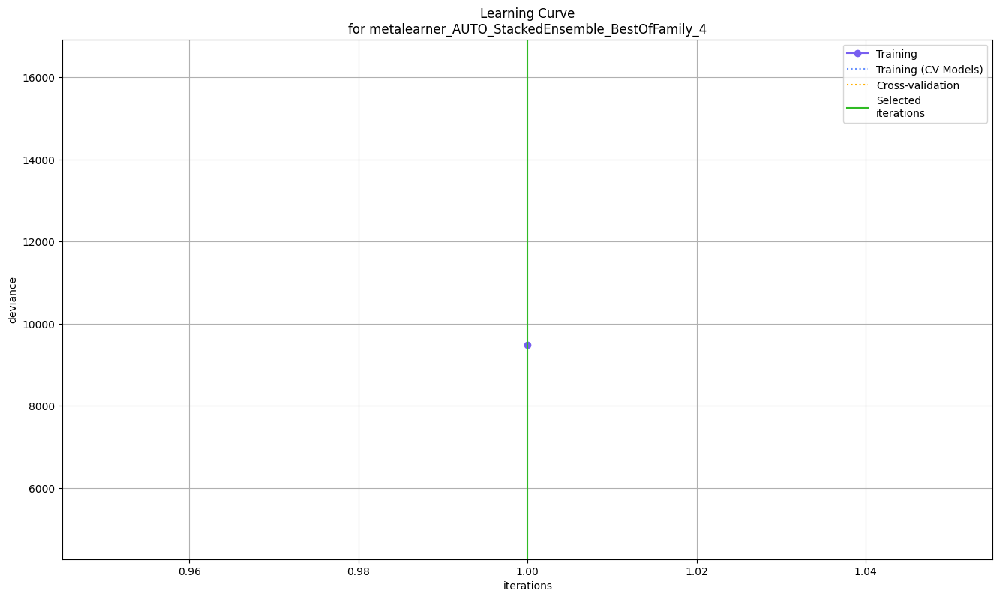

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

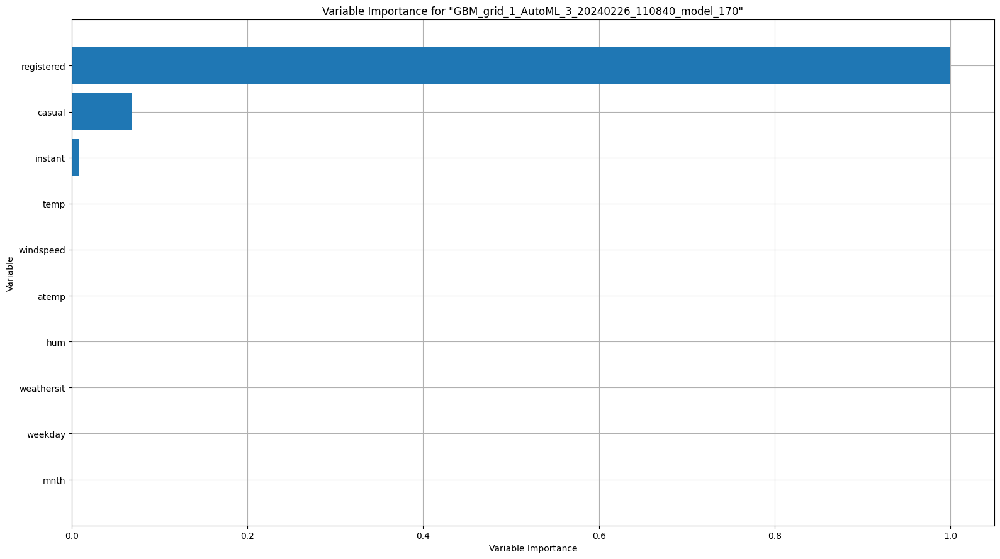

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

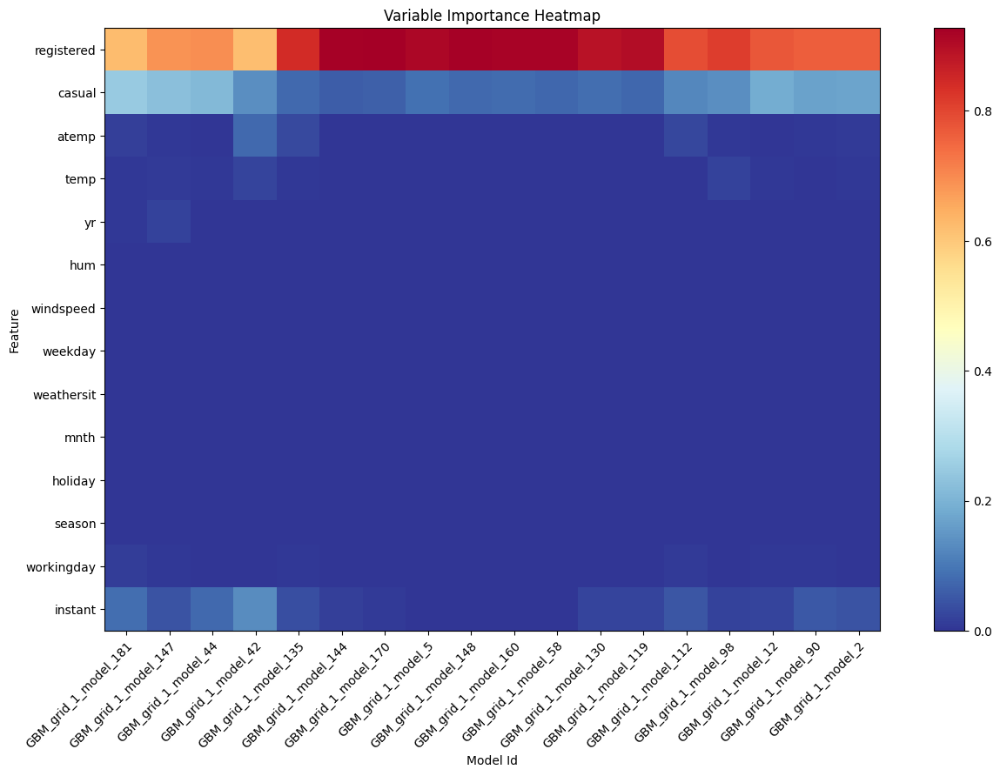

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

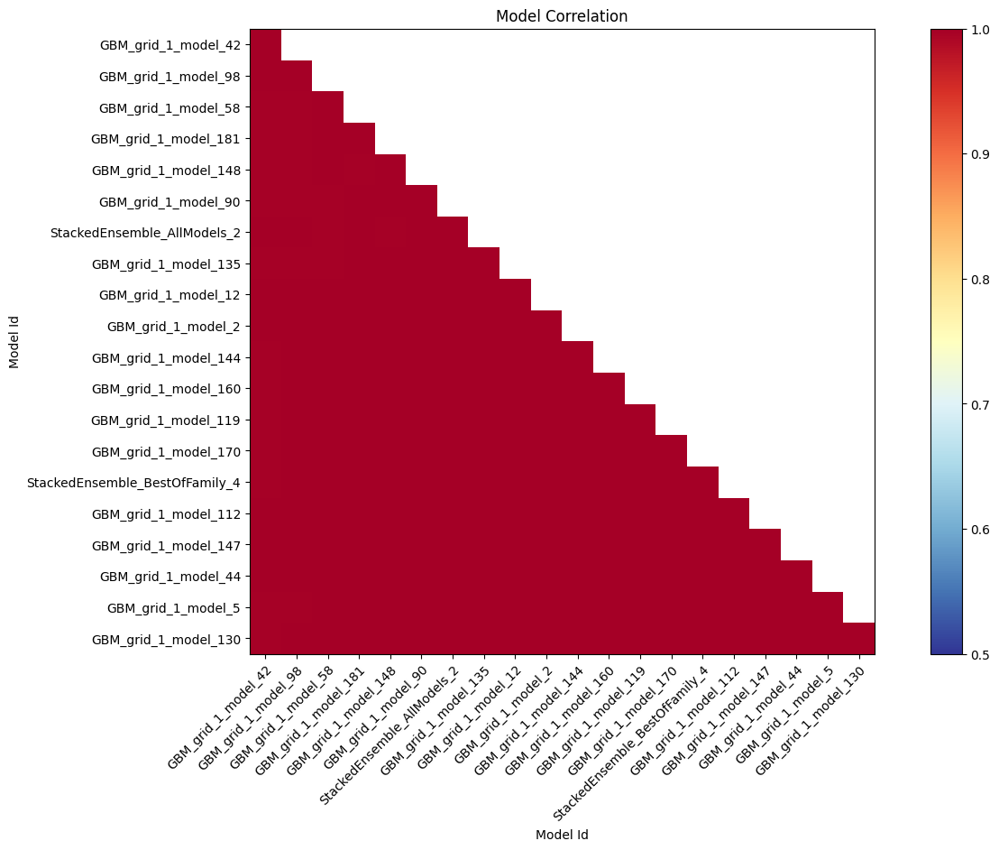

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

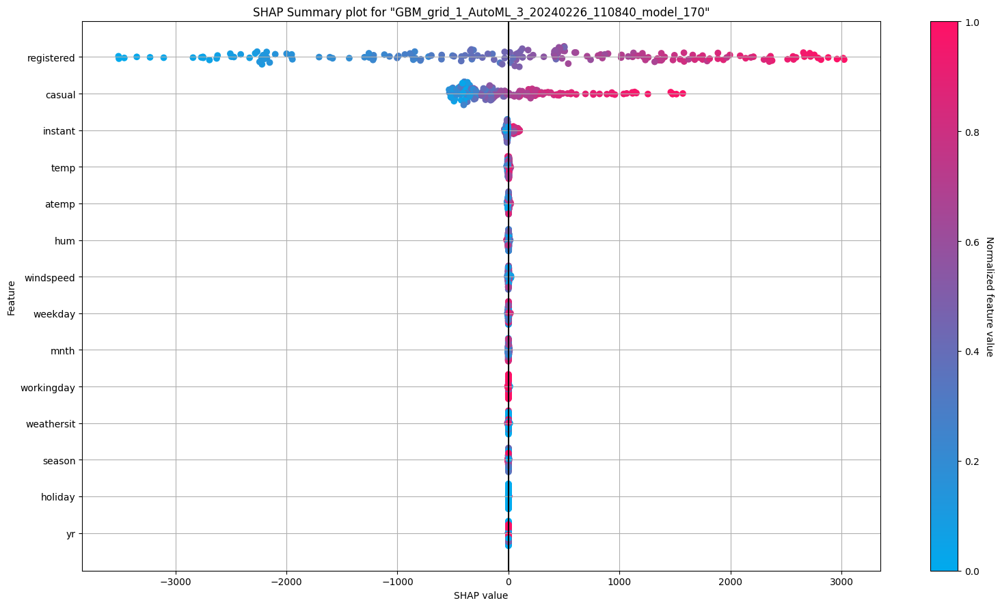

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

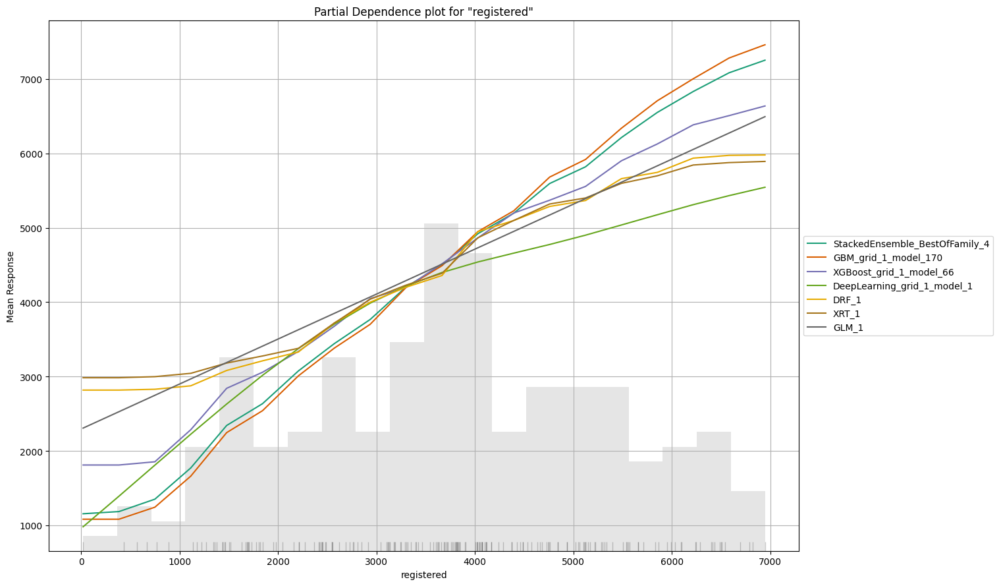

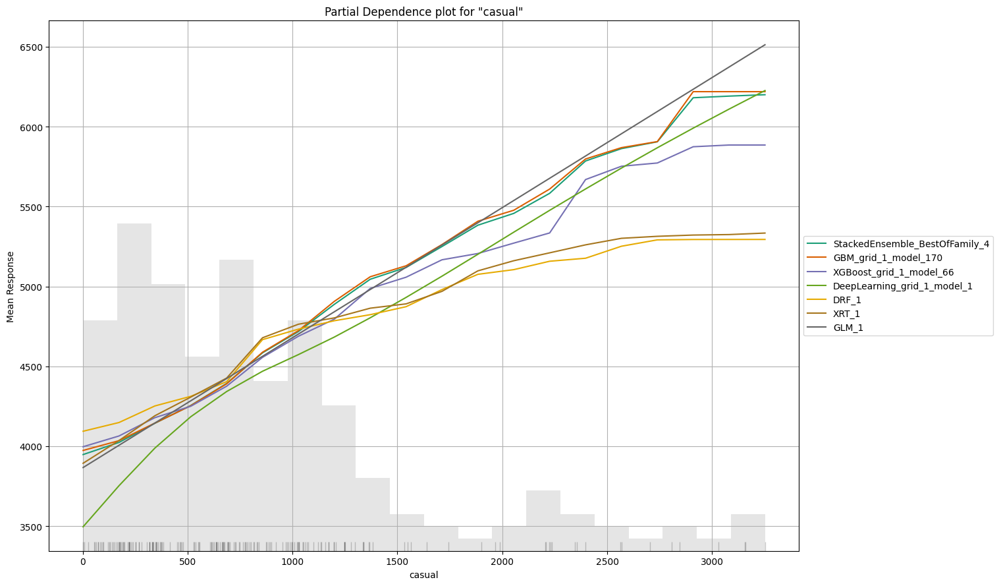

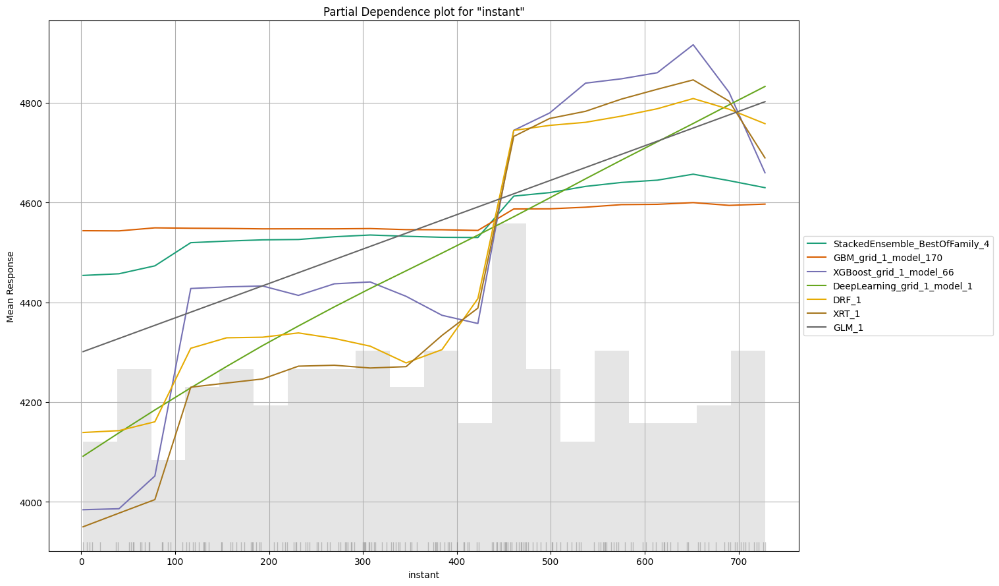

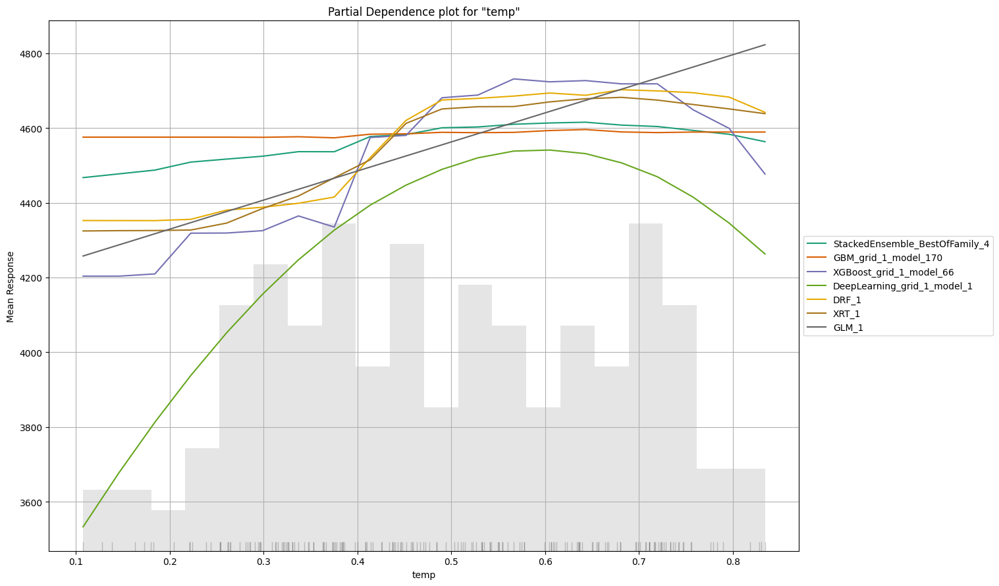

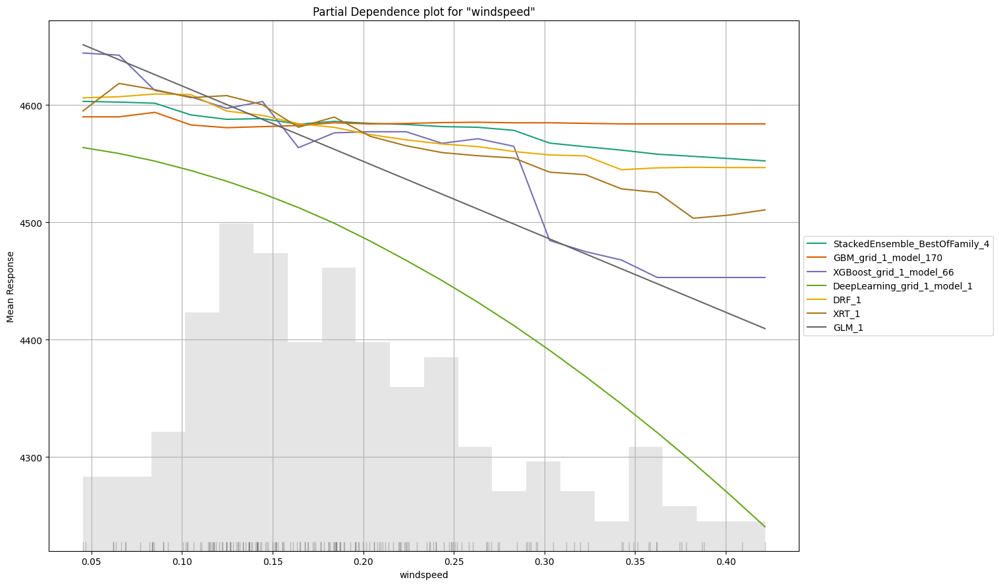

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

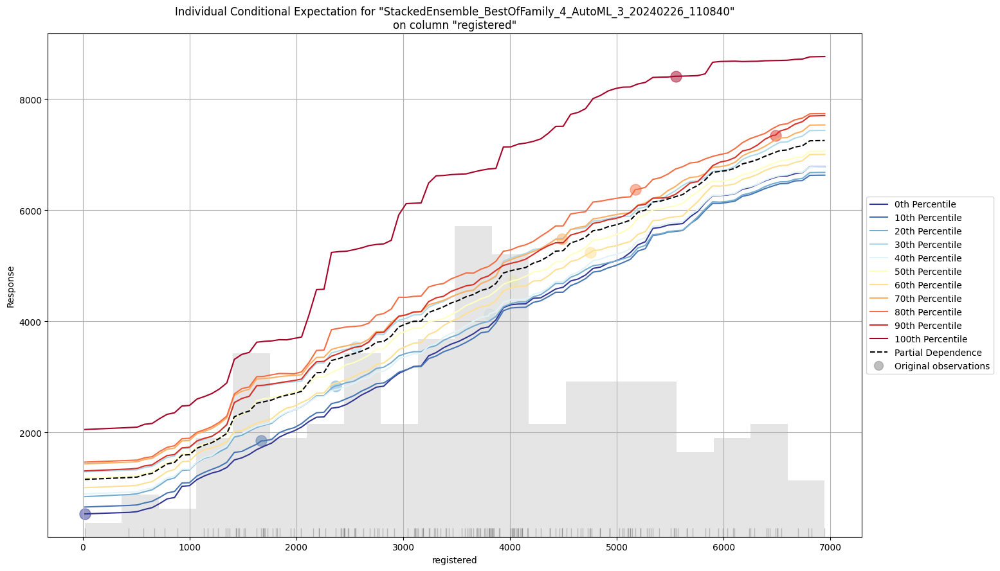

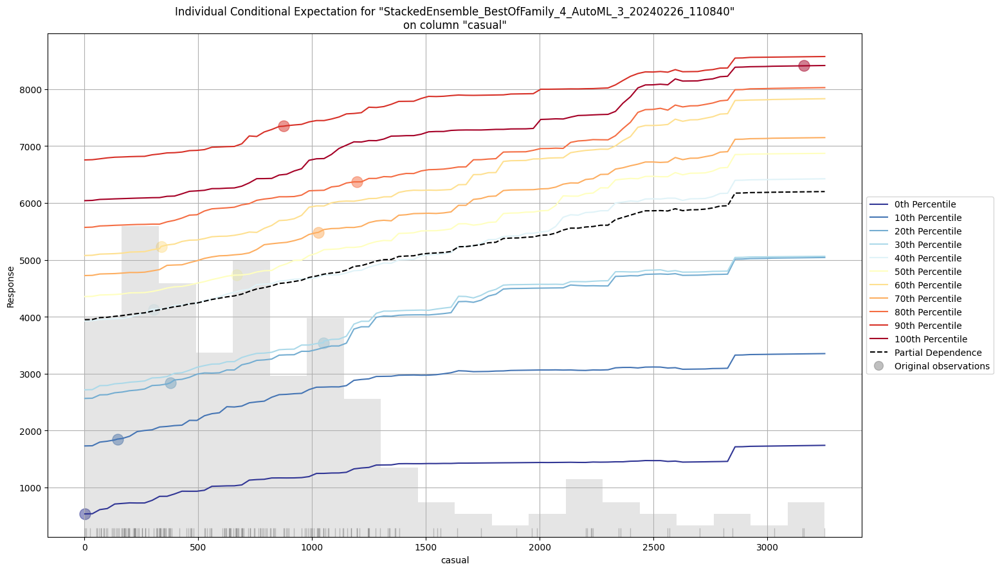

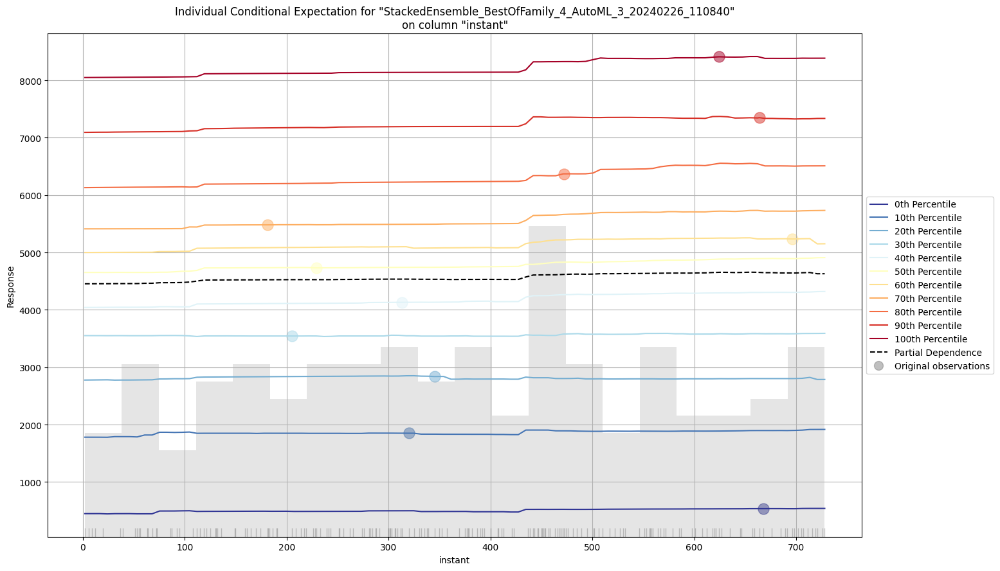

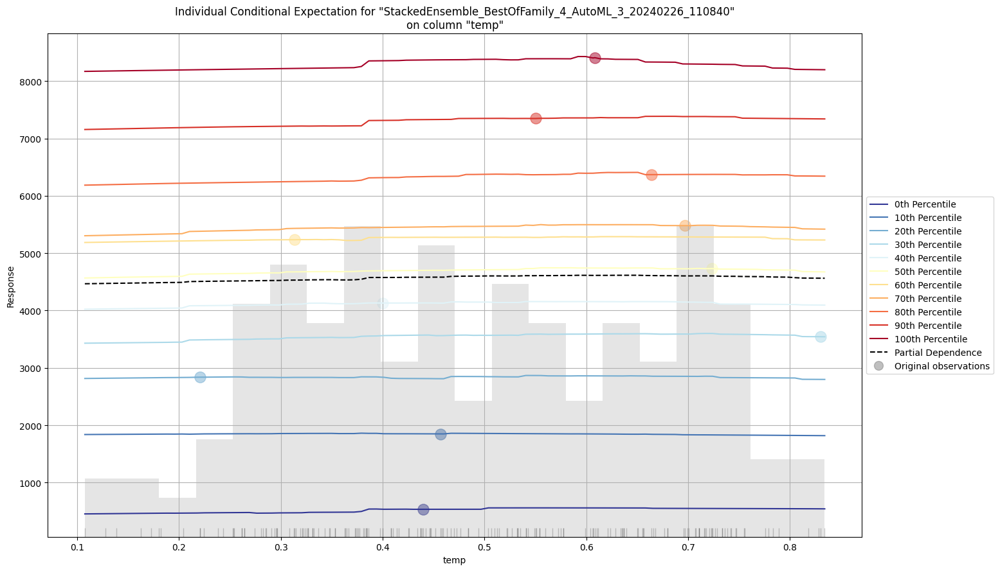

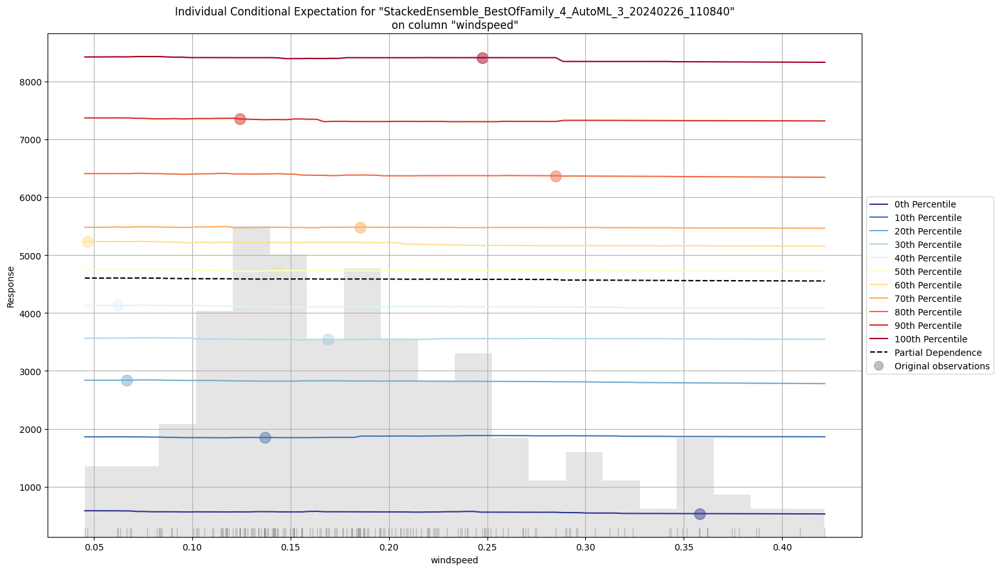

In [20]:
# Explain leader model & compare with all AutoML models
exa1 = aml1.explain(test_hour)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

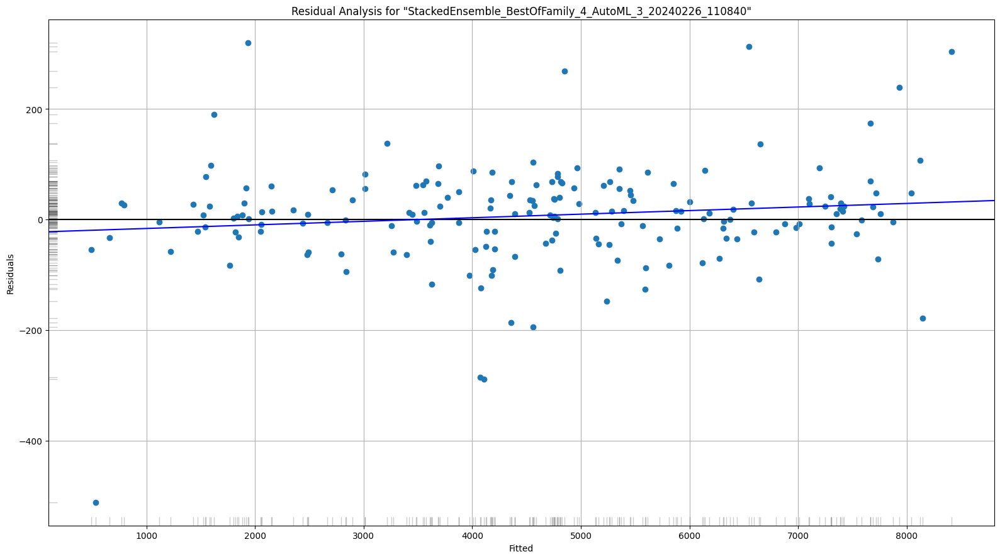

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

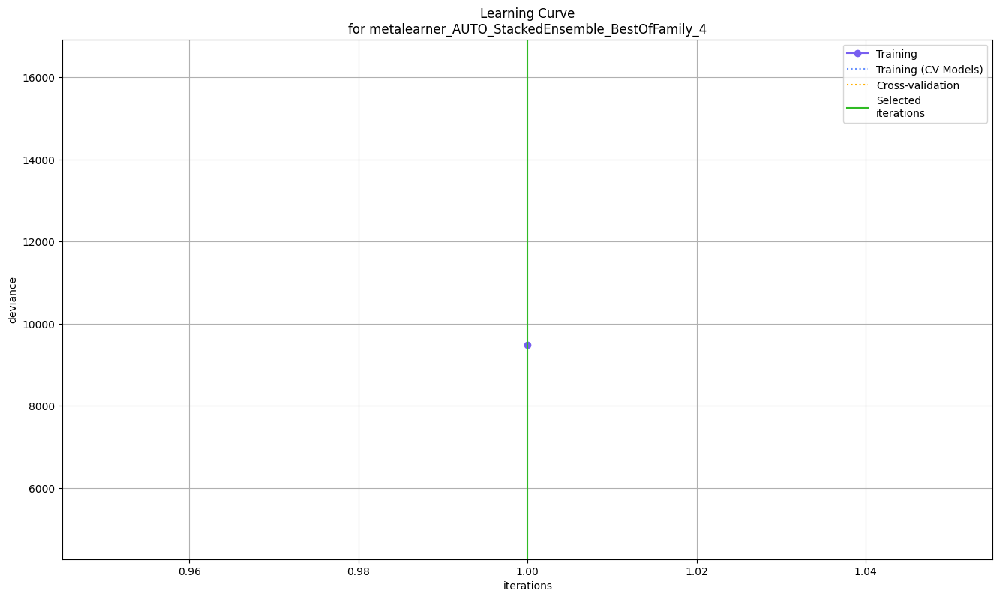

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

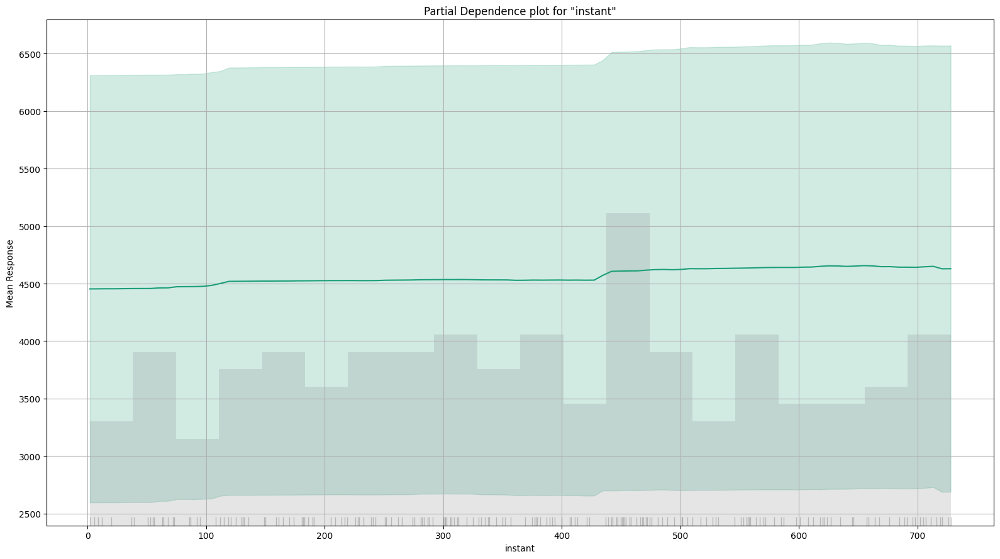

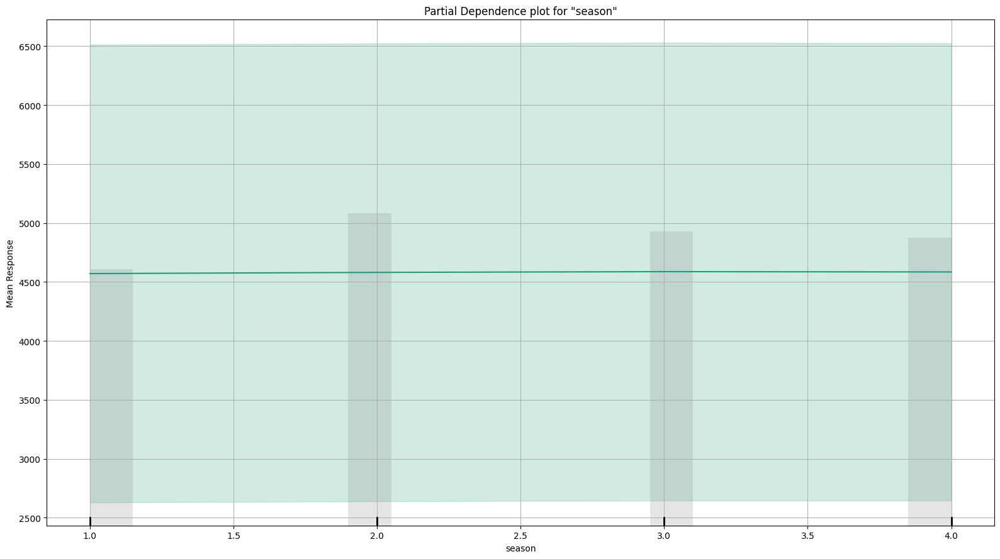

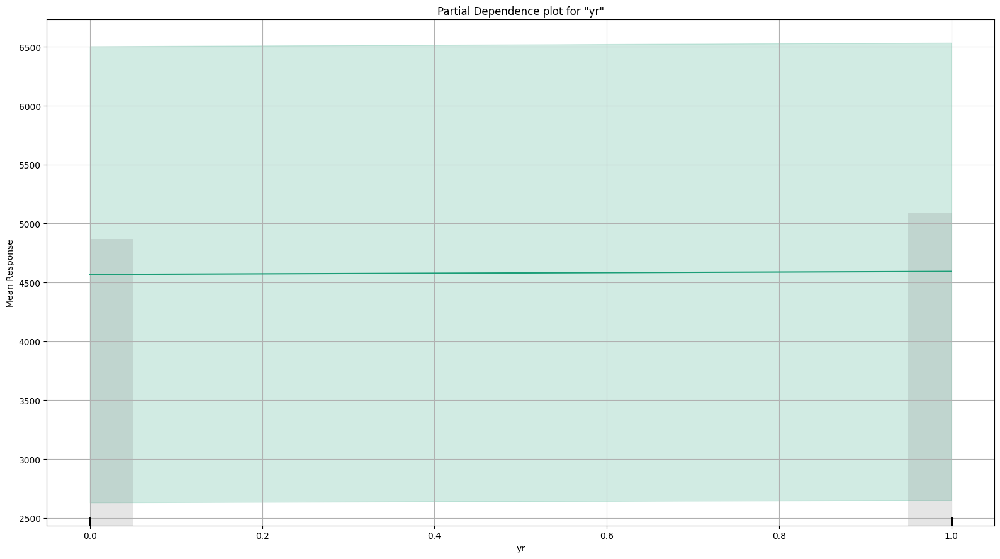

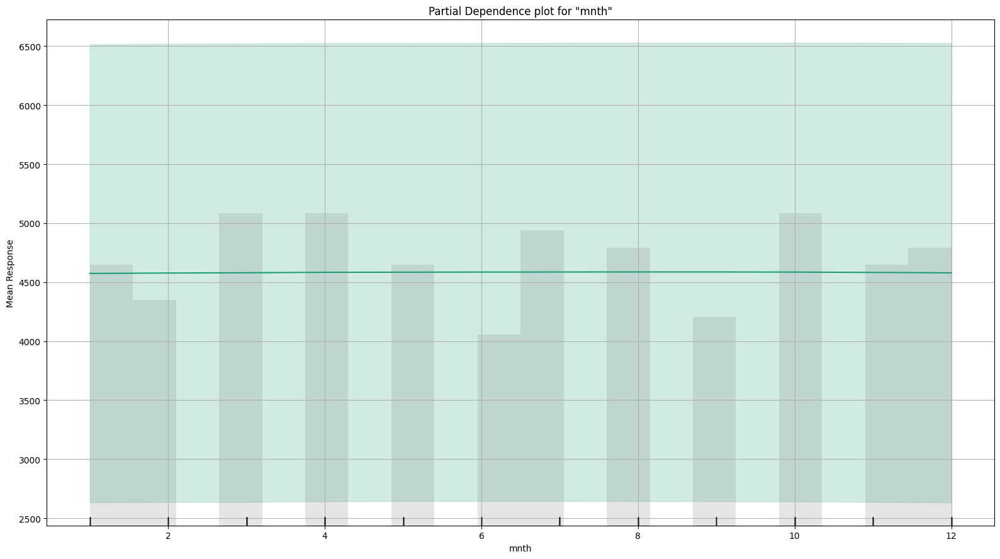

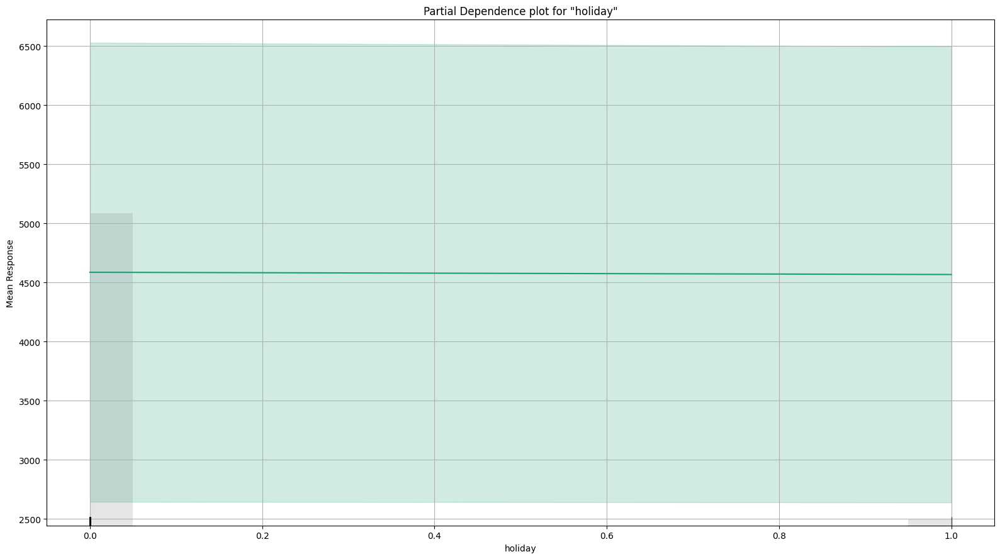

...

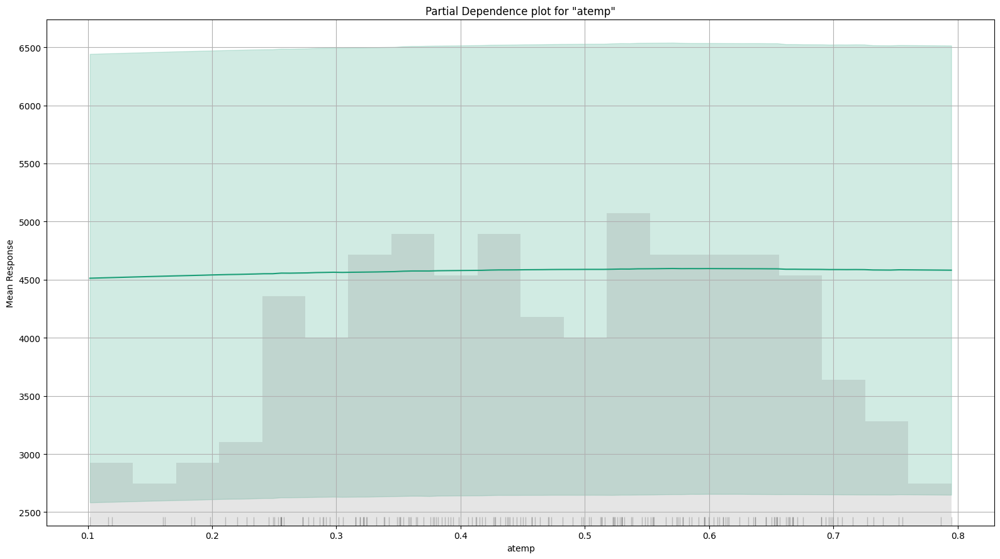

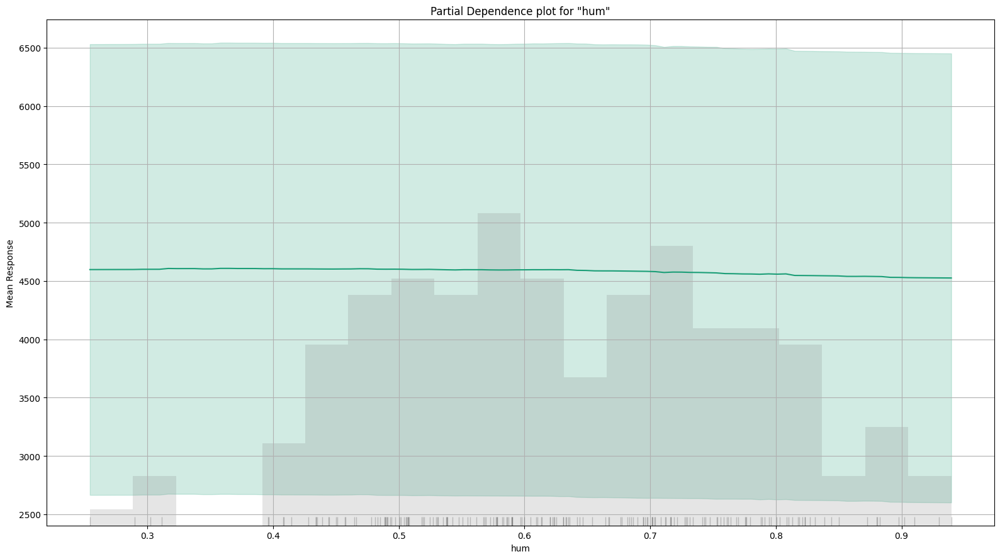

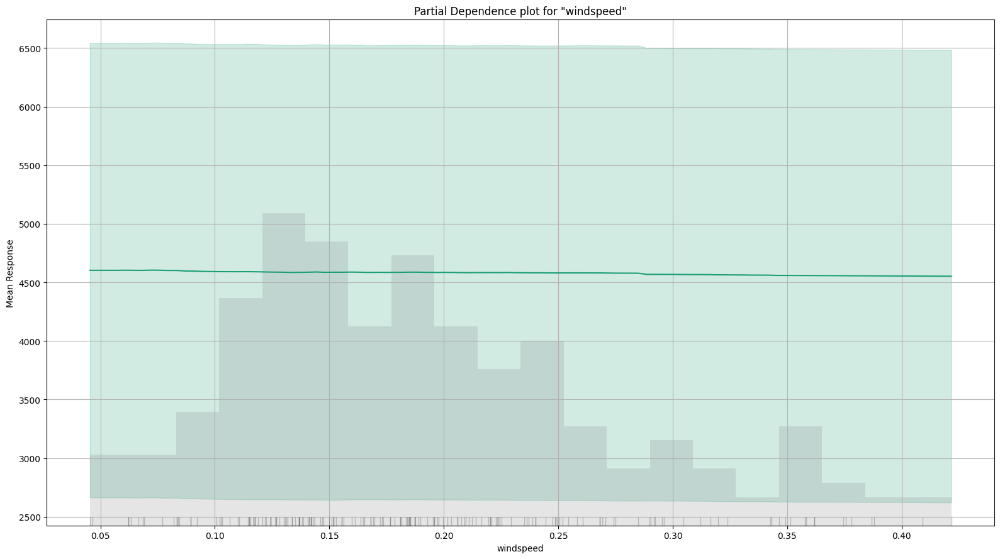

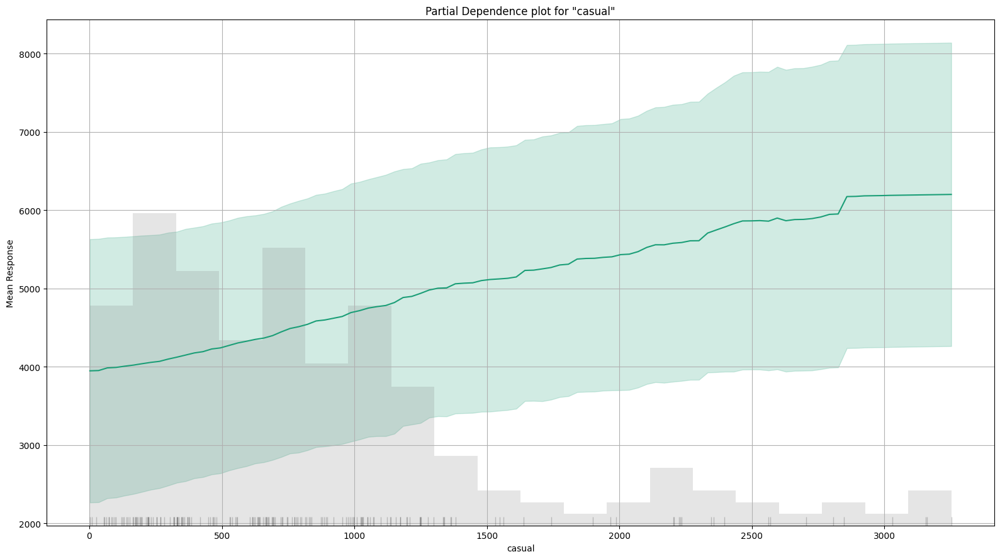

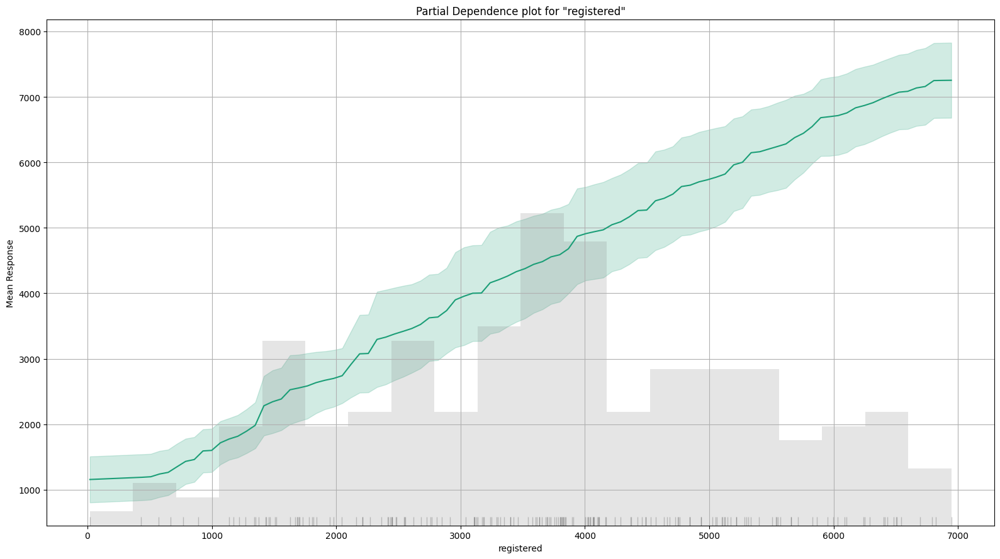

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

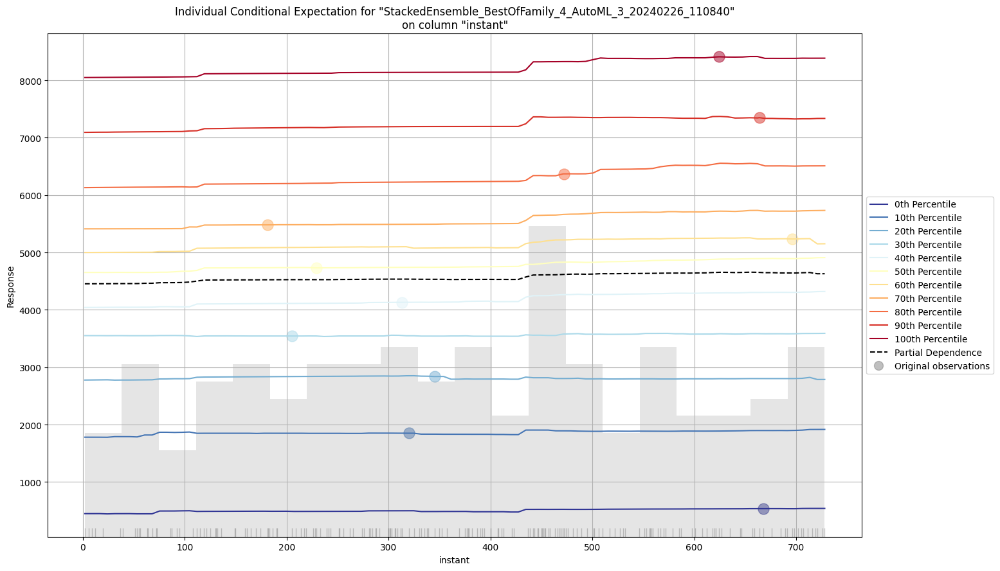

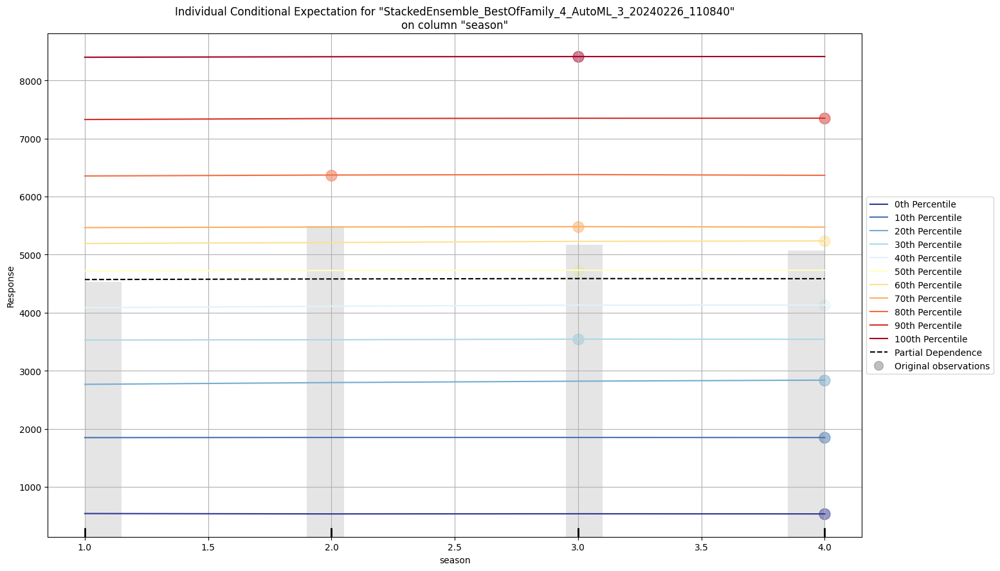

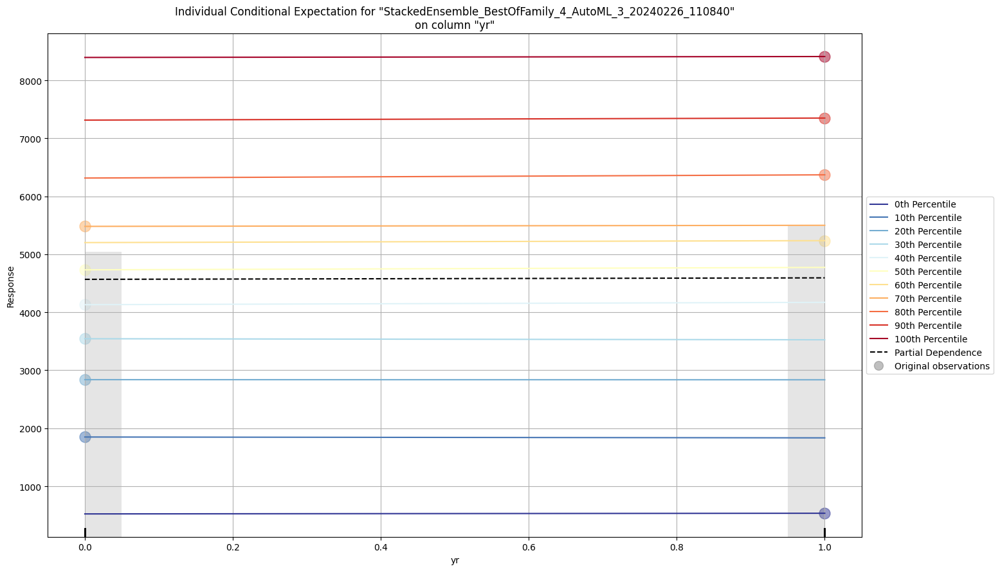

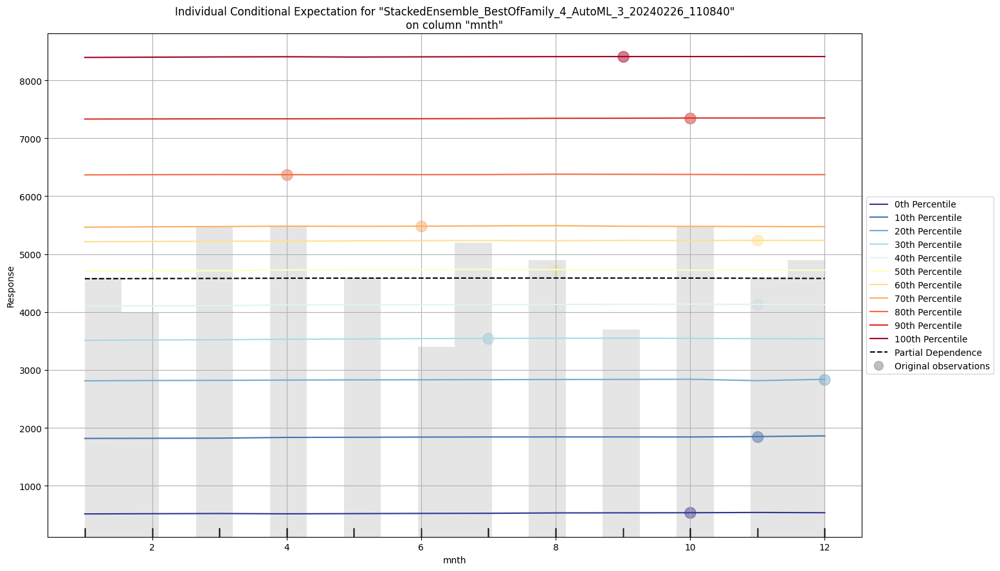

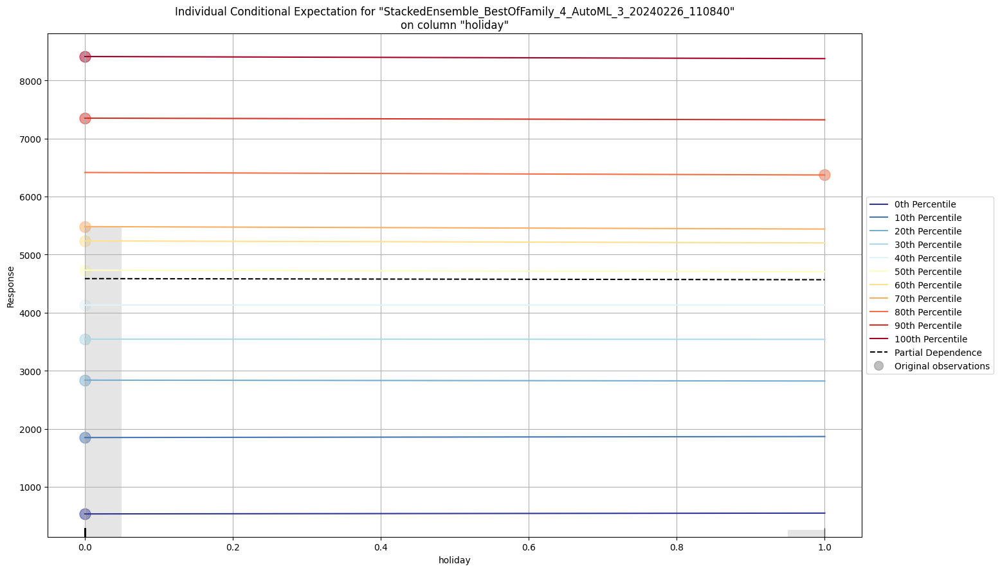

...

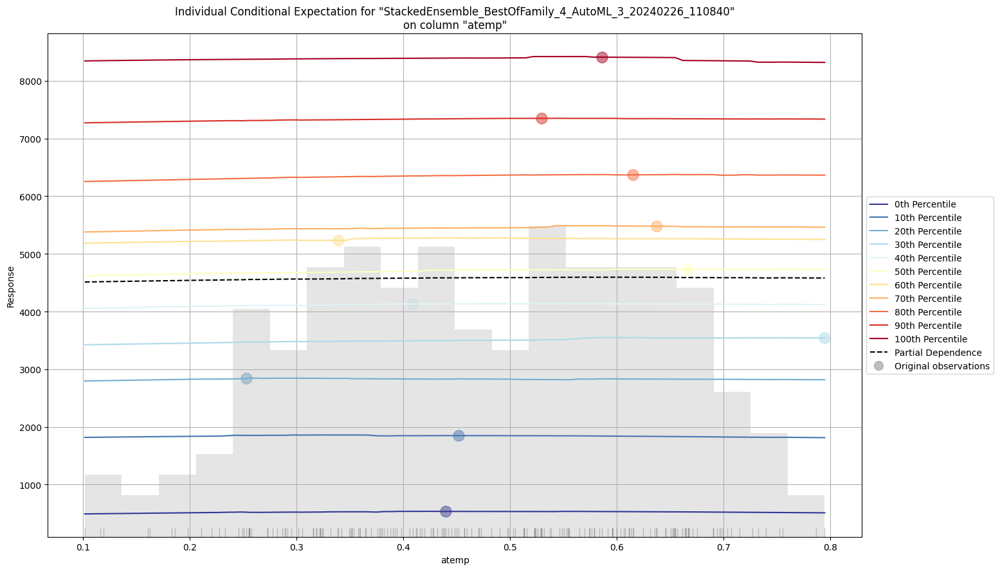

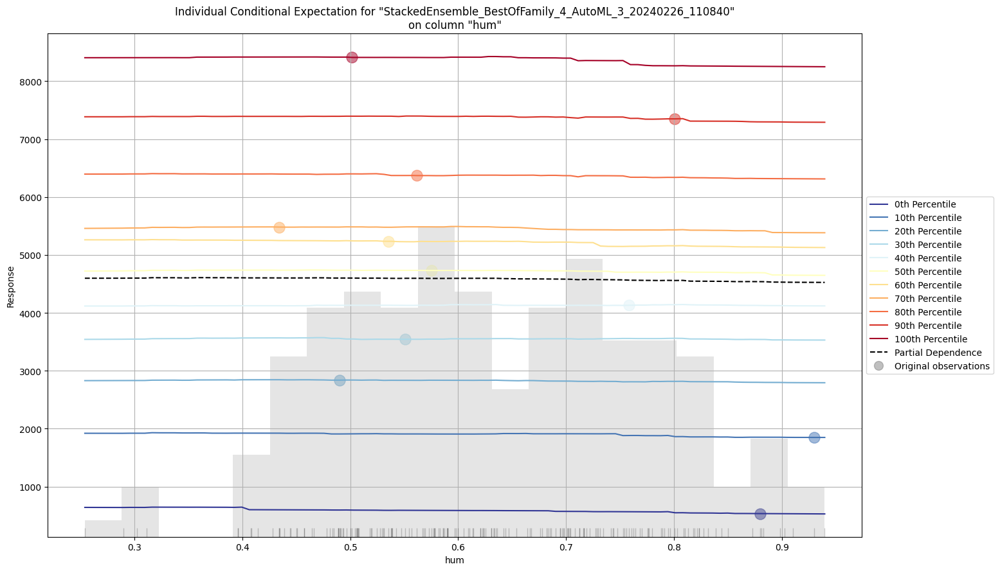

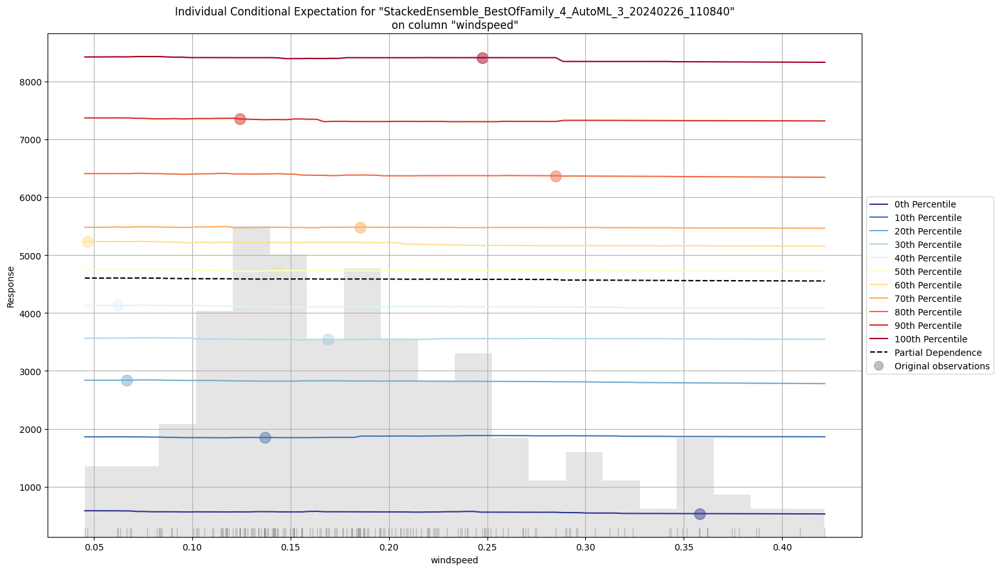

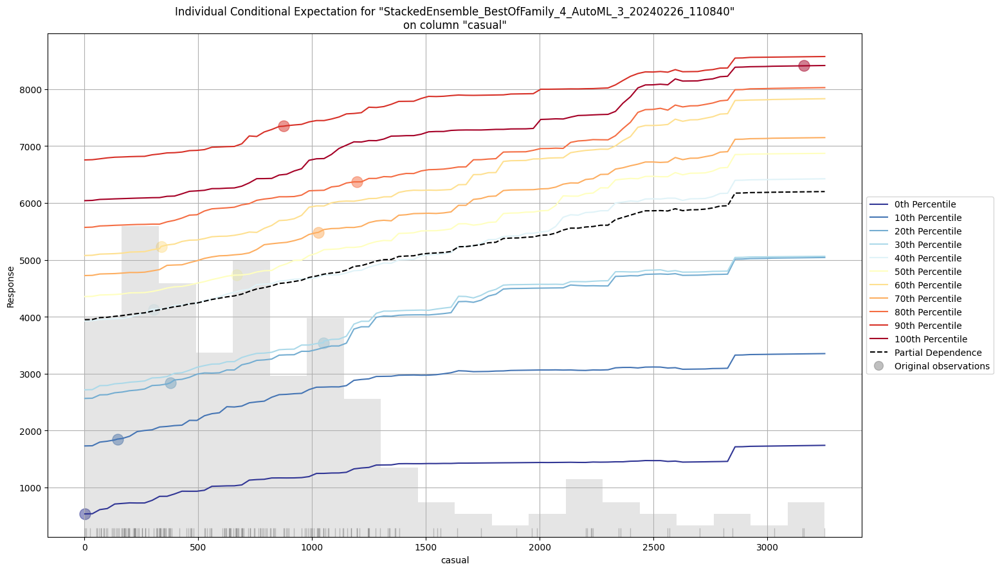

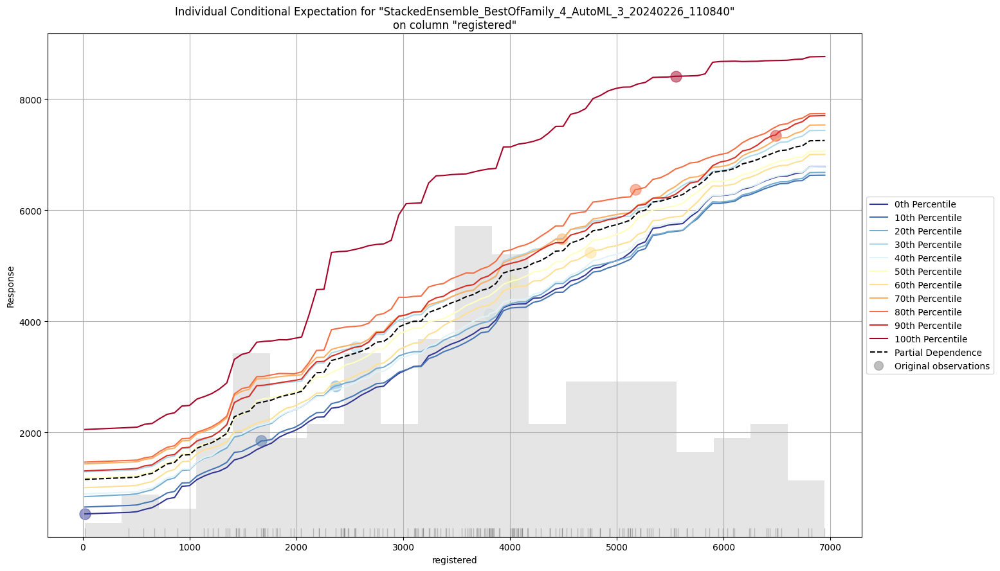

In [21]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm1 = aml1.leader.explain(test_hour)

In [22]:
pred2 = aml1.predict(test_day)

pred2

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


predict
771.34
1582.22
795.432
1219.8
1897.94
1545.36
1521.85
1622.67
1471.26
1804.34
